## Analysis v5: Detecting Covariant Sites 

In [2]:
import os
import textwrap
import pandas as pd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
from natsort import index_natsorted

In [54]:
# Set color values
dutchfield = ["#e60049", "#0bb4ff", "#87bc45", "#ef9b20", "#b33dc6"]

springpastel = ["#fd7f6f", "#7eb0d5", "#b2e061", "#bd7ebe", "#ffb55a"] 

### Calculating the Variance of the AF and FPS values 

It would be quite interesting to see if for each variant site per motif, the variance of the AF and FPS values are correlated.

I.e. if a variant site has a high variance in AF values, does it also have a high variance in FPS values?

First, load the data file as dataframe and then truncate the columns to include on AF and FPS data. Next, convert the dataframe into long format.

In [3]:
# import the data
# filepath = '/home/users/ntu/suffiazi/scratch/outputs/tmp/input_data/E2F5_E2F5_HUMAN.H11MO.0.B_fpscore-af-varsites-combined-matrix-wide.tsv'
filepath = '../output-data/combined_matrix/TFDP1_M08108_2.00_fpscore-af-varsites-combined-matrix-wide.tsv'
matrix_afps = pd.read_csv(filepath, sep='\t')
# extract motif id from filename
motif_id = os.path.basename(filepath).replace('_fpscore-af-varsites-combined-matrix-wide.tsv', '')
motif_id

'TFDP1_M08108_2.00'

In [4]:
matrix_afps.head()

,Chromosome,Start,End,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,2GAMBDQ_norm_varsite_pos,2GAMBDQ_norm_ref_allele,...,ANAB5F7_basal_AF,PU24GB8_lumB_varsite_pos,PU24GB8_lumB_ref_allele,PU24GB8_lumB_alt_allele,PU24GB8_lumB_AF,S6R691V_her2_varsite_pos,S6R691V_her2_ref_allele,S6R691V_her2_alt_allele,S6R691V_her2_AF,region_id
0,chr1,191257,191268,0.00000,0.00000,0.00000,0.00000,0.00000,NaN,NaN,...,0.000000,191258.0,G,C,0.026316,NaN,NaN,NaN,0.000000,chr1:191257-191268
1,chr1,818021,818032,0.02966,0.04399,0.02131,0.03470,0.03443,818025.0,C,...,0.812500,818025.0,C,A,0.833333,818025.0,C,A,0.900000,chr1:818021-818032
2,chr1,818780,818791,0.02572,0.02376,0.02271,0.02814,0.03391,NaN,NaN,...,0.033333,818783.0,T,C,0.055556,818783.0,T,C,0.062500,chr1:818780-818791
3,chr1,960570,960581,0.28046,0.33500,0.28495,0.27618,0.22986,NaN,NaN,...,0.000000,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.000000,chr1:960570-960581
4,chr1,977015,977026,1.10047,0.50514,0.71035,1.21305,1.30155,977023.0,G,...,0.941176,977023.0,G,A,0.947368,977023.0,G,A,0.911765,chr1:977015-977026


Let's filter the loaded table to include only the `_AF` and `_fps` columns, as well as the `region_id` column.

In [5]:
afps_df = matrix_afps.filter(regex='_AF$|_fps$|_id$').copy()
afps_df.head(5)

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,region_id
0,0.00000,0.00000,0.00000,0.00000,0.00000,0.000,0.000000,0.000000,0.026316,0.000000,chr1:191257-191268
1,0.02966,0.04399,0.02131,0.03470,0.03443,0.875,0.900000,0.812500,0.833333,0.900000,chr1:818021-818032
2,0.02572,0.02376,0.02271,0.02814,0.03391,0.000,0.125000,0.033333,0.055556,0.062500,chr1:818780-818791
3,0.28046,0.33500,0.28495,0.27618,0.22986,0.000,0.041667,0.000000,0.000000,0.000000,chr1:960570-960581
4,1.10047,0.50514,0.71035,1.21305,1.30155,1.000,1.000000,0.941176,0.947368,0.911765,chr1:977015-977026


In [6]:
# convert to long format
afps_df_long = afps_df.melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
afps_df_long[['sample_id', 'type']] = afps_df_long['variable'].str.rsplit('_', n=1, expand=True)

# drop the redundant 'variable' column
afps_df_long = afps_df_long.drop(columns=["variable"])

# now pivot the dataframe to create new columns based on the type column
afps_df_lpv = afps_df_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# remove the index name and rename the columns to match the type values
afps_df_lpv = afps_df_lpv.rename_axis(None, axis=1).rename(columns={'fps': 'FPS'})

# sort the dataframe by region_id naturally
afps_df_lpv = afps_df_lpv.reindex(index=index_natsorted(afps_df_lpv['region_id']))
afps_df_lpv = afps_df_lpv.reset_index(drop=True)
afps_df_lpv

,region_id,sample_id,AF,FPS
0,chr1:191257-191268,2GAMBDQ_norm,0.000000,0.0
1,chr1:191257-191268,98JKPD8_lumA,0.000000,0.0
2,chr1:191257-191268,ANAB5F7_basal,0.000000,0.0
3,chr1:191257-191268,PU24GB8_lumB,0.026316,0.0
4,chr1:191257-191268,S6R691V_her2,0.000000,0.0
...,...,...,...,...
47795,chrY:11108019-11108030,2GAMBDQ_norm,0.437500,0.0
47796,chrY:11108019-11108030,98JKPD8_lumA,0.100000,0.0
47797,chrY:11108019-11108030,ANAB5F7_basal,0.382353,0.0
47798,chrY:11108019-11108030,PU24GB8_lumB,0.264706,0.0


In [6]:
# afps_df_lpv[afps_df_lpv['sample_id'] == '2GAMBDQ_norm'].describe()

### AF–FPS Matrix
At this point, we now have both a matrix of AF and FPS values in wide form (`afps_df`) and the same dataset in long form (`afps_df_lpv`). We can scale the FPS values to be between 0 and 1 now.

In [7]:
# use MinMaxScaler to scale the raw fps values to range between 0 and 1
from sklearn.preprocessing import MinMaxScaler
# scale the FPS values to a range of 0-1
# Initialize a MinMaxScaler
scaler = MinMaxScaler()

# copy df
fps_df_scaled = matrix_afps.filter(regex='_fps$|_id$').copy()

# set the index to 'region_id'
fps_df_scaled = fps_df_scaled.set_index('region_id')

# Fit the MinMaxScaler to the 'FPS' column and transform it
fps_df_scaled = pd.DataFrame(scaler.fit_transform(fps_df_scaled), columns=fps_df_scaled.columns, index=fps_df_scaled.index)

# rename columns by adding '_scaled' to the column names
fps_df_scaled = fps_df_scaled.add_suffix('_scaled')
fps_df_scaled

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:191257-191268,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:818021-818032,0.007823,0.011176,0.002785,0.009443,0.009147
chr1:818780-818791,0.006783,0.006036,0.002968,0.007658,0.009009
chr1:960570-960581,0.073969,0.085110,0.037244,0.075158,0.061066
chr1:977015-977026,0.290240,0.128336,0.092845,0.330112,0.345779
...,...,...,...,...,...
chrX:153934861-153934872,0.051878,0.042657,0.022497,0.051831,0.042934
chrX:154444629-154444640,0.012923,0.018879,0.009550,0.024527,0.011246
chrX:155010397-155010408,0.003104,0.001263,0.001144,0.003532,0.005279


Now we should convert the FPS scaled dataframe into long form.

In [8]:
# reset index
fps_df_scaled_long = fps_df_scaled.reset_index()
# convert to long format
fps_df_scaled_long = fps_df_scaled_long.melt(id_vars=["region_id"], var_name="variable", value_name="value")

# split the variable column into sample_id and type columns using reverse split string method, which returns a dataframe of columns based on the number of splits (n=x); this can directly be assigned to new columns in the original dataframe
# Split the 'variable' column into three parts
fps_df_scaled_long[['part1', 'part2', 'part3']] = fps_df_scaled_long['variable'].str.rsplit('_', n=2, expand=True)

# Assign part1 to 'sample_id' and concatenate the other parts to form 'type'
fps_df_scaled_long['sample_id'] = fps_df_scaled_long['part1']
fps_df_scaled_long['type'] = fps_df_scaled_long['part2'].str.upper() + '_' + fps_df_scaled_long['part3']

# Drop the unnecessary columns
fps_df_scaled_long = fps_df_scaled_long.drop(['variable', 'part1', 'part2', 'part3'], axis=1)

# now pivot the dataframe to create new columns based on the type column
fps_df_scaled_lpv = fps_df_scaled_long.pivot(index=['region_id', 'sample_id'], columns='type', values='value').reset_index()

# remove the index name and rename the columns to match the type values
fps_df_scaled_lpv = fps_df_scaled_lpv.rename_axis(None, axis=1)

# sort the dataframe by region_id naturally
fps_df_scaled_lpv = fps_df_scaled_lpv.reindex(index=index_natsorted(fps_df_scaled_lpv['region_id']))
fps_df_scaled_lpv = fps_df_scaled_lpv.reset_index(drop=True)
fps_df_scaled_lpv

,region_id,sample_id,FPS_scaled
0,chr1:191257-191268,2GAMBDQ_norm,0.0
1,chr1:191257-191268,98JKPD8_lumA,0.0
2,chr1:191257-191268,ANAB5F7_basal,0.0
3,chr1:191257-191268,PU24GB8_lumB,0.0
4,chr1:191257-191268,S6R691V_her2,0.0
...,...,...,...
47795,chrY:11108019-11108030,2GAMBDQ_norm,0.0
47796,chrY:11108019-11108030,98JKPD8_lumA,0.0
47797,chrY:11108019-11108030,ANAB5F7_basal,0.0
47798,chrY:11108019-11108030,PU24GB8_lumB,0.0


/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to sile

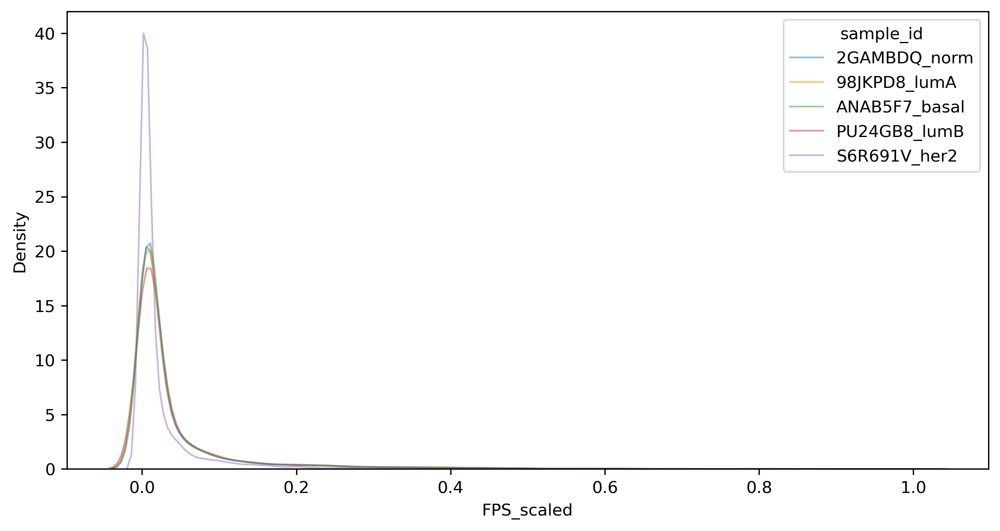

In [8]:
# plot fps distribution
plt.figure(figsize=(10, 5), dpi=300)
sns.kdeplot(data=fps_df_scaled_lpv, x="FPS_scaled", hue="sample_id", fill=False, common_norm=False, alpha=.5, linewidth=1)
plt.show()

### Merging `afps_df_lpv` and `fps_df_scaled_lpv`

Now we can merge the two long dataframes together to get both raw FPS and scaled FPS values in one dataframe.

In [9]:
afps_df_lpv

,region_id,sample_id,AF,FPS
0,chr1:191257-191268,2GAMBDQ_norm,0.000000,0.0
1,chr1:191257-191268,98JKPD8_lumA,0.000000,0.0
2,chr1:191257-191268,ANAB5F7_basal,0.000000,0.0
3,chr1:191257-191268,PU24GB8_lumB,0.026316,0.0
4,chr1:191257-191268,S6R691V_her2,0.000000,0.0
...,...,...,...,...
47795,chrY:11108019-11108030,2GAMBDQ_norm,0.437500,0.0
47796,chrY:11108019-11108030,98JKPD8_lumA,0.100000,0.0
47797,chrY:11108019-11108030,ANAB5F7_basal,0.382353,0.0
47798,chrY:11108019-11108030,PU24GB8_lumB,0.264706,0.0


In [10]:
fps_df_scaled_lpv
fps_df_scaled_lpv.describe()

,FPS_scaled
count,47800.000000
mean,0.037080
std,0.076338
min,0.000000
25%,0.004422
50%,0.008649
75%,0.030330
max,1.000000


In [11]:
# merge two dataframes on region_id and sample_id
afps_full_dfl = afps_df_lpv.merge(fps_df_scaled_lpv, on=['region_id', 'sample_id'])
afps_full_dfl

,region_id,sample_id,AF,FPS,FPS_scaled
0,chr1:191257-191268,2GAMBDQ_norm,0.000000,0.0,0.0
1,chr1:191257-191268,98JKPD8_lumA,0.000000,0.0,0.0
2,chr1:191257-191268,ANAB5F7_basal,0.000000,0.0,0.0
3,chr1:191257-191268,PU24GB8_lumB,0.026316,0.0,0.0
4,chr1:191257-191268,S6R691V_her2,0.000000,0.0,0.0
...,...,...,...,...,...
47795,chrY:11108019-11108030,2GAMBDQ_norm,0.437500,0.0,0.0
47796,chrY:11108019-11108030,98JKPD8_lumA,0.100000,0.0,0.0
47797,chrY:11108019-11108030,ANAB5F7_basal,0.382353,0.0,0.0
47798,chrY:11108019-11108030,PU24GB8_lumB,0.264706,0.0,0.0


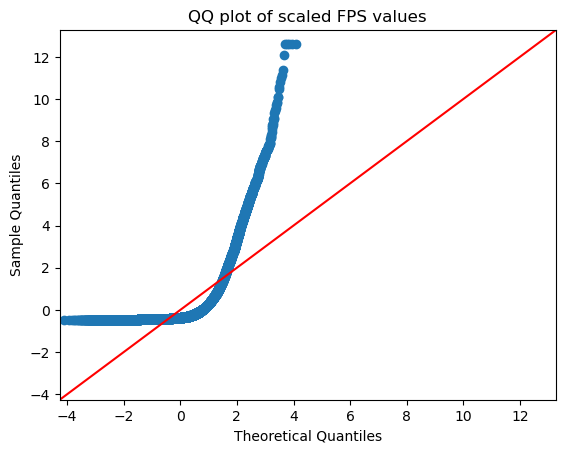

In [12]:
fig = sm.qqplot(afps_full_dfl['FPS_scaled'], line='45', fit=True)
plt.title('QQ plot of scaled FPS values')
plt.show()

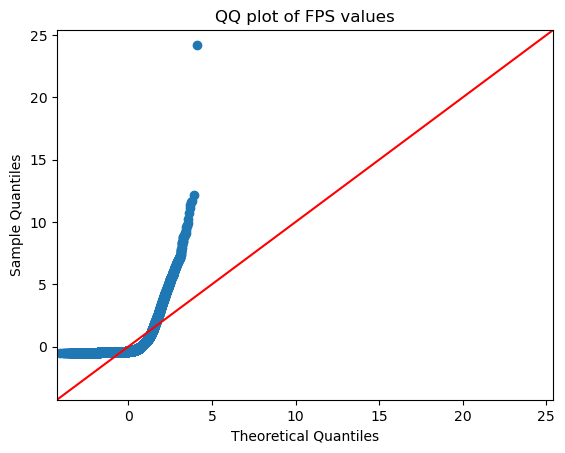

In [13]:
fig = sm.qqplot(afps_full_dfl['FPS'], line='45', fit=True)
plt.title('QQ plot of FPS values')
plt.show()

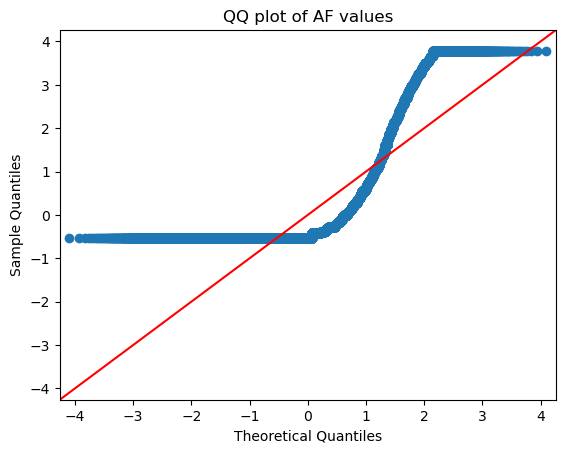

In [14]:
fig = sm.qqplot(afps_full_dfl['AF'], line='45', fit=True)
plt.title('QQ plot of AF values')
plt.show()

/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to sile

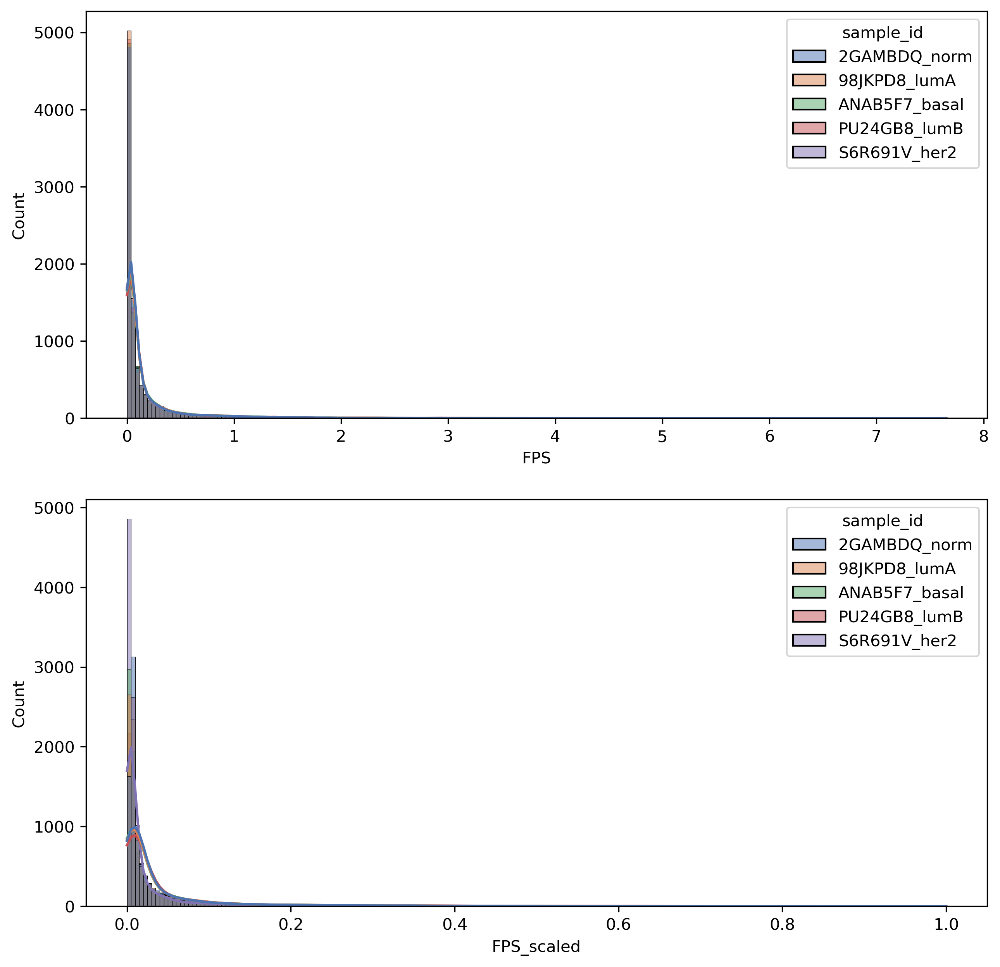

In [14]:
# Create a figure and a 2x2 grid of subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10), dpi=300)
sns.histplot(data=afps_full_dfl, x="FPS", hue="sample_id", bins=200, kde=True, palette="deep", ax=axs[0])
sns.histplot(data=afps_full_dfl, x="FPS_scaled", hue="sample_id", bins=200, kde=True, palette="deep", ax=axs[1])
# # now draw a subset plot where x is above a certain threshold
# sns.histplot(data=afps_full_dfl[afps_full_dfl['FPS'] > 0.5], x="FPS", hue="sample_id", bins=200, kde=True, palette="deep", ax=axs[2])
# plt.title(f"FPS distribution of {motif_id} in all samples")
plt.show()

In [16]:
# save to file
# afps_full_dfl.to_csv(f'/home/msazizan/hyperspace/gatk-workflow/plotting/output-data/AF-FPS_regionsorted_full_longtable/{motif_id}_afps_full_scaled_longtable.tsv', sep='\t', index=False)

/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to sile

(-0.1, 1.1)

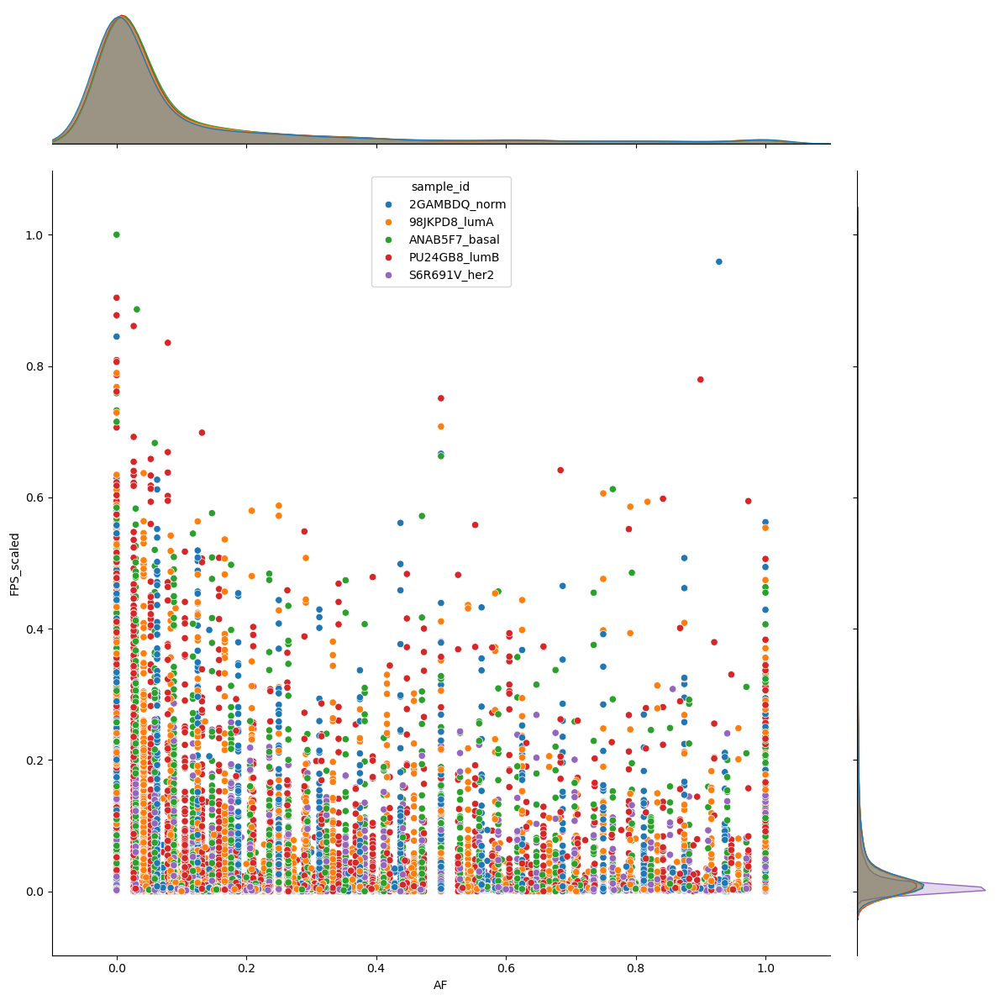

In [18]:
sns.jointplot(data=afps_full_dfl, x='AF', y='FPS_scaled', kind='scatter', hue='sample_id', height=12)
plt.xlim(-0.1, 1.1)

### Filtering Zero Sites

We should filter out the sites that have zero AF values in ALL subtypes, as these are not informative for our analysis. We will also filter out the sites that have zero FPS values in ALL subtypes.

In [12]:
afps_full_dfl

,region_id,sample_id,AF,FPS,FPS_scaled
0,chr1:191257-191268,2GAMBDQ_norm,0.000000,0.0,0.0
1,chr1:191257-191268,98JKPD8_lumA,0.000000,0.0,0.0
2,chr1:191257-191268,ANAB5F7_basal,0.000000,0.0,0.0
3,chr1:191257-191268,PU24GB8_lumB,0.026316,0.0,0.0
4,chr1:191257-191268,S6R691V_her2,0.000000,0.0,0.0
...,...,...,...,...,...
47795,chrY:11108019-11108030,2GAMBDQ_norm,0.437500,0.0,0.0
47796,chrY:11108019-11108030,98JKPD8_lumA,0.100000,0.0,0.0
47797,chrY:11108019-11108030,ANAB5F7_basal,0.382353,0.0,0.0
47798,chrY:11108019-11108030,PU24GB8_lumB,0.264706,0.0,0.0


`FPS` value `== 0` means that the raw FPS values across subtypes are zero, i.e. there is no evidence of footprinting at all at these sites despite a TFBS matching a motif being present (assigned by TOBIAS). AF value `== 0` means that there is no evidence of a variant genotype at these sites across the samples making up a subtype. 

In [13]:
# filter out unique region_id rows that have fps == 0 across the sample_ids and AF == 0
# group by 'region_id' first 
merged_filt = afps_full_dfl.groupby('region_id').filter(lambda x: x['FPS'].sum() > 0 and x['AF'].sum() > 0)
merged_filt

,region_id,sample_id,AF,FPS,FPS_scaled
5,chr1:818021-818032,2GAMBDQ_norm,0.875000,0.03443,0.009147
6,chr1:818021-818032,98JKPD8_lumA,0.900000,0.02966,0.007823
7,chr1:818021-818032,ANAB5F7_basal,0.812500,0.04399,0.011176
8,chr1:818021-818032,PU24GB8_lumB,0.833333,0.03470,0.009443
9,chr1:818021-818032,S6R691V_her2,0.900000,0.02131,0.002785
...,...,...,...,...,...
47790,chrX:155641610-155641621,2GAMBDQ_norm,0.000000,0.01740,0.004623
47791,chrX:155641610-155641621,98JKPD8_lumA,0.000000,0.01249,0.003294
47792,chrX:155641610-155641621,ANAB5F7_basal,0.000000,0.01243,0.003158
47793,chrX:155641610-155641621,PU24GB8_lumB,0.029412,0.01492,0.004060


### Calculating Variation Statistics
With the full data table cleaned up into a long format, we can now calculate the variation statistics for each region. We will calculate variance (Var).


A) First calculate statistics on the raw FPS data.

In [14]:
# extract fps columns
fps_df = matrix_afps.filter(regex='_fps$|_id$').copy()
fps_df

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,region_id
0,0.00000,0.00000,0.00000,0.00000,0.00000,chr1:191257-191268
1,0.02966,0.04399,0.02131,0.03470,0.03443,chr1:818021-818032
2,0.02572,0.02376,0.02271,0.02814,0.03391,chr1:818780-818791
3,0.28046,0.33500,0.28495,0.27618,0.22986,chr1:960570-960581
4,1.10047,0.50514,0.71035,1.21305,1.30155,chr1:977015-977026
...,...,...,...,...,...,...
9555,0.19670,0.16790,0.17212,0.19046,0.16161,chrX:153934861-153934872
9556,0.04900,0.07431,0.07307,0.09013,0.04233,chrX:154444629-154444640
9557,0.01177,0.00497,0.00875,0.01298,0.01987,chrX:155010397-155010408
9558,0.01249,0.01243,0.01329,0.01492,0.01740,chrX:155641610-155641621


Now filter out the rows whose `region_id` is not in the `region_id` column of `merged_filt`. First, reduce the repeated `region_id` column to unique values in `merged_filt`.

In [15]:
merged_filt_uniq_region_id = merged_filt['region_id'].unique()
merged_filt_uniq_region_id


array(['chr1:818021-818032', 'chr1:818780-818791', 'chr1:960570-960581',
       ..., 'chrX:154444629-154444640', 'chrX:155010397-155010408',
       'chrX:155641610-155641621'], dtype=object)

In [19]:
# then using this array, keep only the rows in the fps_df that have `region_id` values in the array
fps_df_filt = fps_df[fps_df['region_id'].isin(merged_filt_uniq_region_id)]
fps_df_filt

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,region_id
1,0.02966,0.04399,0.02131,0.03470,0.03443,chr1:818021-818032
2,0.02572,0.02376,0.02271,0.02814,0.03391,chr1:818780-818791
3,0.28046,0.33500,0.28495,0.27618,0.22986,chr1:960570-960581
4,1.10047,0.50514,0.71035,1.21305,1.30155,chr1:977015-977026
5,0.88179,0.40974,0.53173,0.98628,1.07101,chr1:977047-977058
...,...,...,...,...,...,...
9552,0.02192,0.03699,0.01875,0.01472,0.02839,chrX:153642534-153642545
9555,0.19670,0.16790,0.17212,0.19046,0.16161,chrX:153934861-153934872
9556,0.04900,0.07431,0.07307,0.09013,0.04233,chrX:154444629-154444640
9557,0.01177,0.00497,0.00875,0.01298,0.01987,chrX:155010397-155010408


In [20]:
# calculate variance of fps values across samples per region_id and add to a new column called 'fps_var'
fps_df_filt_ind = fps_df_filt.set_index('region_id')
fps_df_filt_ind['FPS_var'] = fps_df_filt_ind.var(axis=1)

fps_df_filt_ind

,98JKPD8_lumA_fps,ANAB5F7_basal_fps,S6R691V_her2_fps,PU24GB8_lumB_fps,2GAMBDQ_norm_fps,FPS_var
region_id,,,,,,
chr1:818021-818032,0.02966,0.04399,0.02131,0.03470,0.03443,0.000068
chr1:818780-818791,0.02572,0.02376,0.02271,0.02814,0.03391,0.000020
chr1:960570-960581,0.28046,0.33500,0.28495,0.27618,0.22986,0.001393
chr1:977015-977026,1.10047,0.50514,0.71035,1.21305,1.30155,0.117365
chr1:977047-977058,0.88179,0.40974,0.53173,0.98628,1.07101,0.084064
...,...,...,...,...,...,...
chrX:153642534-153642545,0.02192,0.03699,0.01875,0.01472,0.02839,0.000076
chrX:153934861-153934872,0.19670,0.16790,0.17212,0.19046,0.16161,0.000227
chrX:154444629-154444640,0.04900,0.07431,0.07307,0.09013,0.04233,0.000388


B) Then do the same on the fps scaled data.

Filter out the rows whose `region_id` is not in the `region_id` column of `merged_filt_scaled`.

In [25]:
fps_df_scaled

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:191257-191268,0.000000,0.000000,0.000000,0.000000,0.000000
chr1:818021-818032,0.007823,0.011176,0.002785,0.009443,0.009147
chr1:818780-818791,0.006783,0.006036,0.002968,0.007658,0.009009
chr1:960570-960581,0.073969,0.085110,0.037244,0.075158,0.061066
chr1:977015-977026,0.290240,0.128336,0.092845,0.330112,0.345779
...,...,...,...,...,...
chrX:153934861-153934872,0.051878,0.042657,0.022497,0.051831,0.042934
chrX:154444629-154444640,0.012923,0.018879,0.009550,0.024527,0.011246
chrX:155010397-155010408,0.003104,0.001263,0.001144,0.003532,0.005279


In [26]:
# region_id in the scaled df is already used as index, so filter by index
fps_df_scaled_filt = fps_df_scaled[fps_df_scaled.index.isin(merged_filt_uniq_region_id)]
fps_df_scaled_filt


,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:818021-818032,0.007823,0.011176,0.002785,0.009443,0.009147
chr1:818780-818791,0.006783,0.006036,0.002968,0.007658,0.009009
chr1:960570-960581,0.073969,0.085110,0.037244,0.075158,0.061066
chr1:977015-977026,0.290240,0.128336,0.092845,0.330112,0.345779
chr1:977047-977058,0.232565,0.104098,0.069499,0.268400,0.284532
...,...,...,...,...,...
chrX:153642534-153642545,0.005781,0.009398,0.002451,0.004006,0.007542
chrX:153934861-153934872,0.051878,0.042657,0.022497,0.051831,0.042934
chrX:154444629-154444640,0.012923,0.018879,0.009550,0.024527,0.011246


In [27]:
# copy the slice
fps_df_scaled_filt_ind = fps_df_scaled_filt.copy()
fps_df_scaled_filt_ind

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled
region_id,,,,,
chr1:818021-818032,0.007823,0.011176,0.002785,0.009443,0.009147
chr1:818780-818791,0.006783,0.006036,0.002968,0.007658,0.009009
chr1:960570-960581,0.073969,0.085110,0.037244,0.075158,0.061066
chr1:977015-977026,0.290240,0.128336,0.092845,0.330112,0.345779
chr1:977047-977058,0.232565,0.104098,0.069499,0.268400,0.284532
...,...,...,...,...,...
chrX:153642534-153642545,0.005781,0.009398,0.002451,0.004006,0.007542
chrX:153934861-153934872,0.051878,0.042657,0.022497,0.051831,0.042934
chrX:154444629-154444640,0.012923,0.018879,0.009550,0.024527,0.011246


In [28]:
# calculate variance of fps_scaled values across samples per region_id and add to a new column called 'fps_scaled_var'
fps_df_scaled_filt_ind['FPS_scaled_var'] = fps_df_scaled_filt_ind.var(axis=1)
fps_df_scaled_filt_ind

,98JKPD8_lumA_fps_scaled,ANAB5F7_basal_fps_scaled,S6R691V_her2_fps_scaled,PU24GB8_lumB_fps_scaled,2GAMBDQ_norm_fps_scaled,FPS_scaled_var
region_id,,,,,,
chr1:818021-818032,0.007823,0.011176,0.002785,0.009443,0.009147,0.000010
chr1:818780-818791,0.006783,0.006036,0.002968,0.007658,0.009009,0.000005
chr1:960570-960581,0.073969,0.085110,0.037244,0.075158,0.061066,0.000341
chr1:977015-977026,0.290240,0.128336,0.092845,0.330112,0.345779,0.013981
chr1:977047-977058,0.232565,0.104098,0.069499,0.268400,0.284532,0.009694
...,...,...,...,...,...,...
chrX:153642534-153642545,0.005781,0.009398,0.002451,0.004006,0.007542,0.000008
chrX:153934861-153934872,0.051878,0.042657,0.022497,0.051831,0.042934,0.000144
chrX:154444629-154444640,0.012923,0.018879,0.009550,0.024527,0.011246,0.000038


C) Now do the same for the AF data.

In [29]:
# Do the same for AF values
# extract af columns
af_df = matrix_afps.filter(regex='_AF$|_id$')
af_df


,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,region_id
0,0.000000,0.000000,0.000000,0.026316,0.000000,chr1:191257-191268
1,0.875000,0.900000,0.812500,0.833333,0.900000,chr1:818021-818032
2,0.000000,0.125000,0.033333,0.055556,0.062500,chr1:818780-818791
3,0.000000,0.041667,0.000000,0.000000,0.000000,chr1:960570-960581
4,1.000000,1.000000,0.941176,0.947368,0.911765,chr1:977015-977026
...,...,...,...,...,...,...
9555,0.062500,0.000000,0.000000,0.000000,0.000000,chrX:153934861-153934872
9556,0.000000,0.125000,0.058824,0.105263,0.000000,chrX:154444629-154444640
9557,0.083333,0.312500,0.000000,0.392857,0.100000,chrX:155010397-155010408
9558,0.000000,0.000000,0.000000,0.029412,0.000000,chrX:155641610-155641621


In [30]:
# filter by region_id
af_df_filt = af_df[af_df['region_id'].isin(merged_filt_uniq_region_id)]
af_df_filt

,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,region_id
1,0.875000,0.900000,0.812500,0.833333,0.900000,chr1:818021-818032
2,0.000000,0.125000,0.033333,0.055556,0.062500,chr1:818780-818791
3,0.000000,0.041667,0.000000,0.000000,0.000000,chr1:960570-960581
4,1.000000,1.000000,0.941176,0.947368,0.911765,chr1:977015-977026
5,0.750000,1.000000,0.500000,0.789474,0.588235,chr1:977047-977058
...,...,...,...,...,...,...
9552,0.062500,0.000000,0.000000,0.000000,0.000000,chrX:153642534-153642545
9555,0.062500,0.000000,0.000000,0.000000,0.000000,chrX:153934861-153934872
9556,0.000000,0.125000,0.058824,0.105263,0.000000,chrX:154444629-154444640
9557,0.083333,0.312500,0.000000,0.392857,0.100000,chrX:155010397-155010408


In [31]:
af_df_filt_ind = af_df_filt.set_index('region_id')
# then calculate variance of af values across samples per region_id and add to a new column called 'af_var'
af_df_filt_ind['AF_var'] = af_df_filt_ind.var(axis=1)
af_df_filt_ind

,2GAMBDQ_norm_AF,98JKPD8_lumA_AF,ANAB5F7_basal_AF,PU24GB8_lumB_AF,S6R691V_her2_AF,AF_var
region_id,,,,,,
chr1:818021-818032,0.875000,0.900000,0.812500,0.833333,0.900000,0.001576
chr1:818780-818791,0.000000,0.125000,0.033333,0.055556,0.062500,0.002113
chr1:960570-960581,0.000000,0.041667,0.000000,0.000000,0.000000,0.000347
chr1:977015-977026,1.000000,1.000000,0.941176,0.947368,0.911765,0.001510
chr1:977047-977058,0.750000,1.000000,0.500000,0.789474,0.588235,0.037434
...,...,...,...,...,...,...
chrX:153642534-153642545,0.062500,0.000000,0.000000,0.000000,0.000000,0.000781
chrX:153934861-153934872,0.062500,0.000000,0.000000,0.000000,0.000000,0.000781
chrX:154444629-154444640,0.000000,0.125000,0.058824,0.105263,0.000000,0.003363


D) Now merge the statistics tables together on `region_id` index.

In [33]:
fps_filt_var = fps_df_filt_ind.filter(regex='_var$|_id$').copy()
fps_filt_var

,FPS_var
region_id,
chr1:818021-818032,0.000068
chr1:818780-818791,0.000020
chr1:960570-960581,0.001393
chr1:977015-977026,0.117365
chr1:977047-977058,0.084064
...,...
chrX:153642534-153642545,0.000076
chrX:153934861-153934872,0.000227
chrX:154444629-154444640,0.000388


In [34]:
fps_sc_filt_var = fps_df_scaled_filt_ind.filter(regex='_var$|_id$').copy()
af_filt_var = af_df_filt_ind.filter(regex='_var$|_id$').copy()
# merge on region_id index from both tables
merged_var_tmp = fps_filt_var.merge(fps_sc_filt_var, left_index=True, right_index=True)
# now merge with af_df
merged_var = merged_var_tmp.merge(af_filt_var, left_index=True, right_index=True)
merged_var

,FPS_var,FPS_scaled_var,AF_var
region_id,,,
chr1:818021-818032,0.000068,0.000010,0.001576
chr1:818780-818791,0.000020,0.000005,0.002113
chr1:960570-960581,0.001393,0.000341,0.000347
chr1:977015-977026,0.117365,0.013981,0.001510
chr1:977047-977058,0.084064,0.009694,0.037434
...,...,...,...
chrX:153642534-153642545,0.000076,0.000008,0.000781
chrX:153934861-153934872,0.000227,0.000144,0.000781
chrX:154444629-154444640,0.000388,0.000038,0.003363


Now we have a table of stats data to merge with the `merge_filt` raw data.

In [36]:
# set the index to 'region_id'
merged_filt_i = merged_filt.set_index('region_id')
merged_filt_i

,sample_id,AF,FPS,FPS_scaled
region_id,,,,
chr1:818021-818032,2GAMBDQ_norm,0.875000,0.03443,0.009147
chr1:818021-818032,98JKPD8_lumA,0.900000,0.02966,0.007823
chr1:818021-818032,ANAB5F7_basal,0.812500,0.04399,0.011176
chr1:818021-818032,PU24GB8_lumB,0.833333,0.03470,0.009443
chr1:818021-818032,S6R691V_her2,0.900000,0.02131,0.002785
...,...,...,...,...
chrX:155641610-155641621,2GAMBDQ_norm,0.000000,0.01740,0.004623
chrX:155641610-155641621,98JKPD8_lumA,0.000000,0.01249,0.003294
chrX:155641610-155641621,ANAB5F7_basal,0.000000,0.01243,0.003158


In [39]:
# merge afps_full_dfli with stats df on region_id
merged_stat = merged_filt_i.merge(merged_var, left_index=True, right_index=True, how='left')
merged_stat


,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
region_id,,,,,,,
chr1:818021-818032,2GAMBDQ_norm,0.875000,0.03443,0.009147,0.000068,0.000010,0.001576
chr1:818021-818032,98JKPD8_lumA,0.900000,0.02966,0.007823,0.000068,0.000010,0.001576
chr1:818021-818032,ANAB5F7_basal,0.812500,0.04399,0.011176,0.000068,0.000010,0.001576
chr1:818021-818032,PU24GB8_lumB,0.833333,0.03470,0.009443,0.000068,0.000010,0.001576
chr1:818021-818032,S6R691V_her2,0.900000,0.02131,0.002785,0.000068,0.000010,0.001576
...,...,...,...,...,...,...,...
chrX:155641610-155641621,2GAMBDQ_norm,0.000000,0.01740,0.004623,0.000004,0.000001,0.000173
chrX:155641610-155641621,98JKPD8_lumA,0.000000,0.01249,0.003294,0.000004,0.000001,0.000173
chrX:155641610-155641621,ANAB5F7_basal,0.000000,0.01243,0.003158,0.000004,0.000001,0.000173


In [42]:
# drop the FPS and FPS_var columns
merged_stat = merged_stat.drop(columns=merged_stat.filter(regex='FPS_var|FPS$').columns)
merged_stat

,sample_id,AF,FPS_scaled,FPS_scaled_var,AF_var
region_id,,,,,
chr1:818021-818032,2GAMBDQ_norm,0.875000,0.009147,0.000010,0.001576
chr1:818021-818032,98JKPD8_lumA,0.900000,0.007823,0.000010,0.001576
chr1:818021-818032,ANAB5F7_basal,0.812500,0.011176,0.000010,0.001576
chr1:818021-818032,PU24GB8_lumB,0.833333,0.009443,0.000010,0.001576
chr1:818021-818032,S6R691V_her2,0.900000,0.002785,0.000010,0.001576
...,...,...,...,...,...
chrX:155641610-155641621,2GAMBDQ_norm,0.000000,0.004623,0.000001,0.000173
chrX:155641610-155641621,98JKPD8_lumA,0.000000,0.003294,0.000001,0.000173
chrX:155641610-155641621,ANAB5F7_basal,0.000000,0.003158,0.000001,0.000173


In [43]:
# rearrange columns
merged_stat = merged_stat[['sample_id', 'AF', 'FPS_scaled', 'AF_var', 'FPS_scaled_var']]
merged_stat

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr1:818021-818032,2GAMBDQ_norm,0.875000,0.009147,0.001576,0.000010
chr1:818021-818032,98JKPD8_lumA,0.900000,0.007823,0.001576,0.000010
chr1:818021-818032,ANAB5F7_basal,0.812500,0.011176,0.001576,0.000010
chr1:818021-818032,PU24GB8_lumB,0.833333,0.009443,0.001576,0.000010
chr1:818021-818032,S6R691V_her2,0.900000,0.002785,0.001576,0.000010
...,...,...,...,...,...
chrX:155641610-155641621,2GAMBDQ_norm,0.000000,0.004623,0.000173,0.000001
chrX:155641610-155641621,98JKPD8_lumA,0.000000,0.003294,0.000173,0.000001
chrX:155641610-155641621,ANAB5F7_basal,0.000000,0.003158,0.000173,0.000001


In [24]:
# save file 
# afps_stats_mergesorted.to_csv(f'/home/msazizan/hyperspace/gatk-workflow/plotting/output-data/AF-FPS_regionsorted_full_longtable/{motif_id}_afps_full_scaled_longtable_with_stats.tsv', sep='\t', index=False)

#### ASIDE: Visualizing `AF_var` and `FPS_scaled_var`
We can now see if there is a correlation between the variance of the AF and FPS values, per `region_id`. As the statistics are calculated per `region_id`, we can plot the `FPS_scaled_var` and `AF_var` values against each other.

In [47]:
# subset a copy of the dataframe with only the AF_var and FPS_scaled_var columns and region_id
merged_stat_corrplot = merged_stat[['AF_var', 'FPS_scaled_var']].copy().drop_duplicates()
merged_stat_corrplot

,AF_var,FPS_scaled_var
region_id,,
chr1:818021-818032,0.001576,0.000010
chr1:818780-818791,0.002113,0.000005
chr1:960570-960581,0.000347,0.000341
chr1:977015-977026,0.001510,0.013981
chr1:977047-977058,0.037434,0.009694
...,...,...
chrX:153642534-153642545,0.000781,0.000008
chrX:153934861-153934872,0.000781,0.000144
chrX:154444629-154444640,0.003363,0.000038


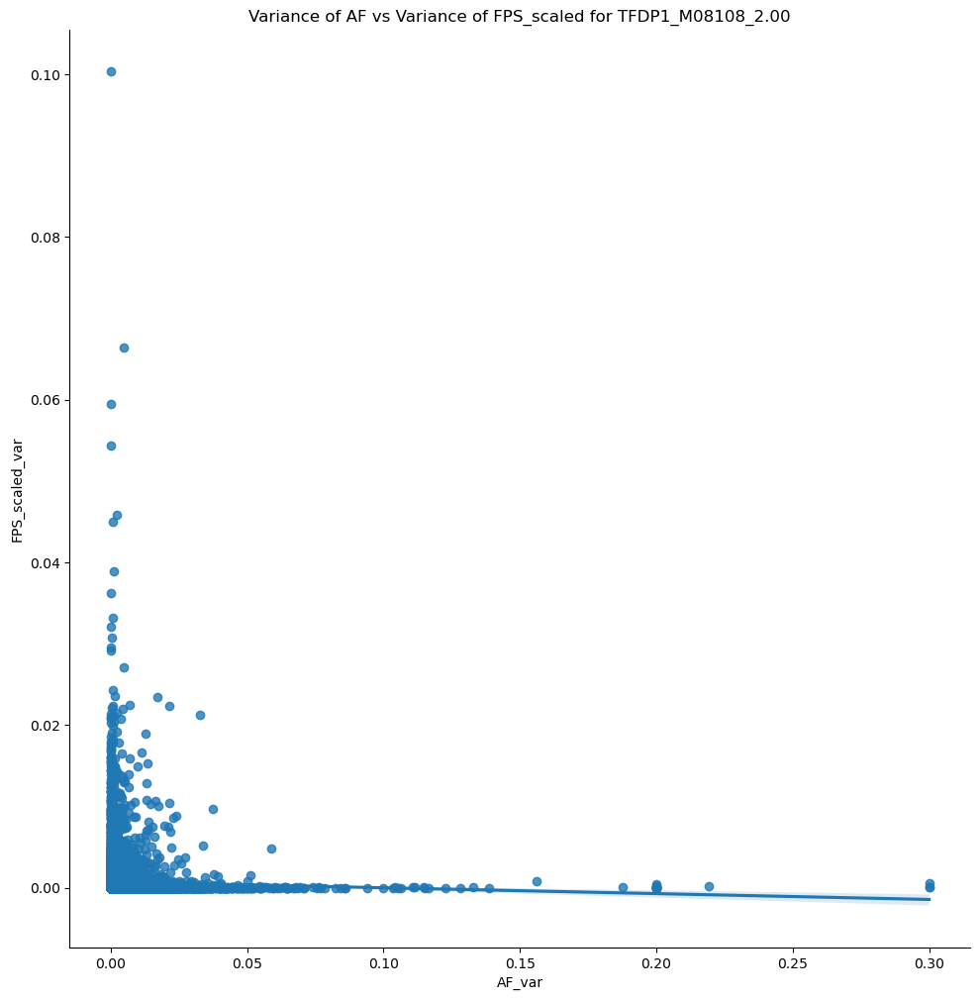

In [51]:
# plot lmplot
sns.lmplot(data=merged_stat_corrplot, x='AF_var', y='FPS_scaled_var', fit_reg=True, height=10)
plt.title(f'Variance of AF vs Variance of FPS_scaled for {motif_id}')
plt.show()

### Finding Covariant Sites 

Now that `merged_stat` contains the variance statistics for both AF and FPS values, we can find the sites that have high variance in both AF and FPS values. We can do this by filtering the `merged_stat` table to include only the rows where both `AF_var` and `FPS_scaled_var` are above a certain threshold.

To remove arbitrariness, IQR outlier method can be used to find the threshold for high variance.

In [53]:
merged_stat

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr1:818021-818032,2GAMBDQ_norm,0.875000,0.009147,0.001576,0.000010
chr1:818021-818032,98JKPD8_lumA,0.900000,0.007823,0.001576,0.000010
chr1:818021-818032,ANAB5F7_basal,0.812500,0.011176,0.001576,0.000010
chr1:818021-818032,PU24GB8_lumB,0.833333,0.009443,0.001576,0.000010
chr1:818021-818032,S6R691V_her2,0.900000,0.002785,0.001576,0.000010
...,...,...,...,...,...
chrX:155641610-155641621,2GAMBDQ_norm,0.000000,0.004623,0.000173,0.000001
chrX:155641610-155641621,98JKPD8_lumA,0.000000,0.003294,0.000173,0.000001
chrX:155641610-155641621,ANAB5F7_basal,0.000000,0.003158,0.000173,0.000001


In [55]:
# subset the dataframe to only include the AF_var and FPS_scaled_var columns and keep only unique rows
merged_stat_var_only = merged_stat[['AF_var', 'FPS_scaled_var']].copy().drop_duplicates()
merged_stat_var_only

,AF_var,FPS_scaled_var
region_id,,
chr1:818021-818032,0.001576,0.000010
chr1:818780-818791,0.002113,0.000005
chr1:960570-960581,0.000347,0.000341
chr1:977015-977026,0.001510,0.013981
chr1:977047-977058,0.037434,0.009694
...,...,...
chrX:153642534-153642545,0.000781,0.000008
chrX:153934861-153934872,0.000781,0.000144
chrX:154444629-154444640,0.003363,0.000038


In [66]:

# output only in full decimal format
pd.options.display.float_format = '{:,.10f}'.format

merged_stat_var_only.describe()

,AF_var,FPS_scaled_var
count,"8,706.0000000000","8,706.0000000000"
mean,0.0050121562,0.0006703083
std,0.0135215887,0.0028748655
min,0.0000000000,0.0000001154
25%,0.0002222218,0.0000030535
50%,0.0007812500,0.0000130523
75%,0.0046578723,0.0001551501
max,0.3000000000,0.1003564941


We can plot boxplots to visualize the distribution of `AF_var` and `FPS_scaled_var` values.

/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)


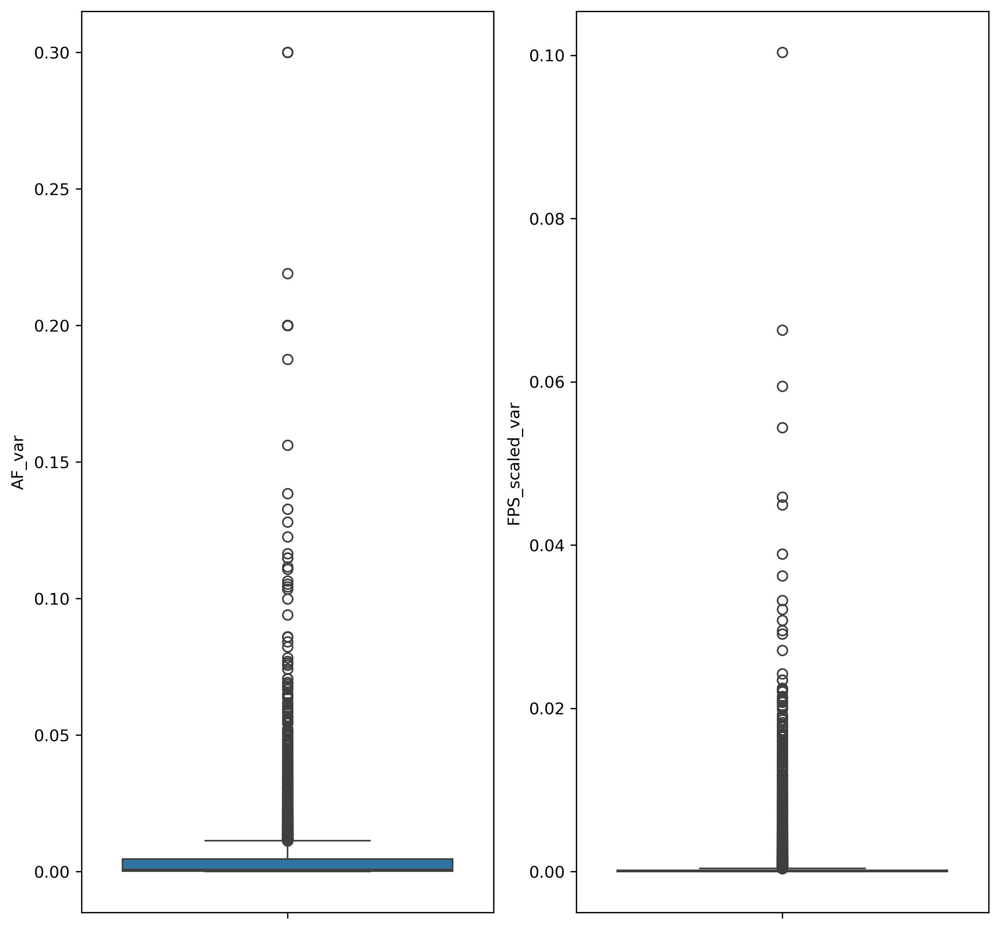

In [63]:
# plot bloxplots
fig, axs = plt.subplots(1, 2, figsize=(10, 10), dpi=300)
sns.boxplot(data=merged_stat_var_only, y='AF_var', ax=axs[0])
sns.boxplot(data=merged_stat_var_only, y='FPS_scaled_var', ax=axs[1])
plt.show()

The distribution is highly skewed and we are looking at variances, not raw data points, so we can probably ignore the lower bounds and just use the upper bounds as the threshold to filter for potentially interesting sites. 




Calculate the distribution of `AF_var` and `FPS_scaled_var` values and then calculate the IQR for each. Then, calculate the upper and lower bounds for the `AF_var` and `FPS_scaled_var` values.

In [61]:
# Calculate the IQR for AF_var and FPS_scaled_var separately

# for af var
q1_vaf = merged_stat_var_only['AF_var'].quantile(0.25)
q3_vaf = merged_stat_var_only['AF_var'].quantile(0.75)
iqr_vaf = q3_vaf - q1_vaf
lower_bound_outl_vaf = q1_vaf - (1.5 * iqr_vaf)
upper_bound_outl_vaf = q3_vaf + (1.5 * iqr_vaf)

# for fps scaled var
q1_vfps = merged_stat_var_only['FPS_scaled_var'].quantile(0.25)
q3_vfps = merged_stat_var_only['FPS_scaled_var'].quantile(0.75)
iqr_vfps = q3_vfps - q1_vfps
lower_bound_outl_vfps = q1_vfps - (1.5 * iqr_vfps)
upper_bound_outl_vfps = q3_vfps + (1.5 * iqr_vfps)

print(f"Outlier fences for AF variance: {lower_bound_outl_vaf, upper_bound_outl_vaf}")

print(f"Outlier fences for FPS_scaled variance: {lower_bound_outl_vfps, upper_bound_outl_vfps}")


Outlier fences for AF variance: (-0.006431253983107125, 0.011311348045919874)
Outlier fences for FPS_scaled variance: (-0.00022509123785722238, 0.0003832948356750625)


In [73]:
# using the outlier fence of upper bound, get the region_id that are outliers for both AF_var and FPS_scaled_var
outliers_af_fps_var = merged_stat_var_only[(merged_stat_var_only['AF_var'] > upper_bound_outl_vaf) & (merged_stat_var_only['FPS_scaled_var'] > upper_bound_outl_vfps)]

outliers_af_fps_var

,AF_var,FPS_scaled_var
region_id,,
chr1:977047-977058,0.0374337735,0.0096944414
chr1:977174-977185,0.2000000000,0.0004778301
chr1:977206-977217,0.1561711121,0.0007892381
chr1:977394-977405,0.3000000000,0.0005563766
chr1:3857731-3857742,0.0145139906,0.0008135613
...,...,...
chr22:39520618-39520629,0.0143663497,0.0009832663
chr22:42369353-42369364,0.0150271288,0.0050366065
chr22:50474997-50475008,0.0379097602,0.0016298791


In [74]:
merged_filt_i

,sample_id,AF,FPS,FPS_scaled
region_id,,,,
chr1:818021-818032,2GAMBDQ_norm,0.8750000000,0.0344300000,0.0091469165
chr1:818021-818032,98JKPD8_lumA,0.9000000000,0.0296600000,0.0078225964
chr1:818021-818032,ANAB5F7_basal,0.8125000000,0.0439900000,0.0111760940
chr1:818021-818032,PU24GB8_lumB,0.8333330000,0.0347000000,0.0094430505
chr1:818021-818032,S6R691V_her2,0.9000000000,0.0213100000,0.0027852896
...,...,...,...,...
chrX:155641610-155641621,2GAMBDQ_norm,0.0000000000,0.0174000000,0.0046226067
chrX:155641610-155641621,98JKPD8_lumA,0.0000000000,0.0124900000,0.0032941412
chrX:155641610-155641621,ANAB5F7_basal,0.0000000000,0.0124300000,0.0031579643


In [76]:
# now get the region_id as a list, and subset the original dataframe to only include these region_id
outliers_var_list = outliers_af_fps_var.index.tolist()

# subset the merged_filt_i dataframe to only include the region_id in the outliers_var_list
outliers_affps = merged_filt_i[merged_filt_i.index.isin(outliers_var_list)]

# then merge with outliers_af_fps_var on the index
outliers_affps_full = outliers_affps.merge(outliers_af_fps_var, left_index=True, right_index=True).drop(columns=['FPS'])
outliers_affps_full

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr1:977047-977058,2GAMBDQ_norm,0.7500000000,0.2845320673,0.0374337735,0.0096944414
chr1:977047-977058,98JKPD8_lumA,1.0000000000,0.2325653158,0.0374337735,0.0096944414
chr1:977047-977058,ANAB5F7_basal,0.5000000000,0.1040984939,0.0374337735,0.0096944414
chr1:977047-977058,PU24GB8_lumB,0.7894740000,0.2684003418,0.0374337735,0.0096944414
chr1:977047-977058,S6R691V_her2,0.5882350000,0.0694989224,0.0374337735,0.0096944414
...,...,...,...,...,...
chrX:119606547-119606558,2GAMBDQ_norm,0.7500000000,0.0945774698,0.0117199061,0.0005698779
chrX:119606547-119606558,98JKPD8_lumA,0.6666670000,0.1117423343,0.0117199061,0.0005698779
chrX:119606547-119606558,ANAB5F7_basal,0.9411760000,0.1081278836,0.0117199061,0.0005698779


In [90]:
# sort the outliers_affps_full dataframe by ascending order of AF_var and FPS_scaled_var
outliers_affps_full_srt = outliers_affps_full.sort_values(by=['AF_var', 'FPS_scaled_var'], ascending=[False, False])
outliers_affps_full_srt

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr1:977394-977405,2GAMBDQ_norm,1.0000000000,0.0643658129,0.3000000000,0.0005563766
chr1:977394-977405,98JKPD8_lumA,0.0000000000,0.0593050918,0.3000000000,0.0005563766
chr1:977394-977405,ANAB5F7_basal,0.0000000000,0.0245625089,0.3000000000,0.0005563766
chr1:977394-977405,PU24GB8_lumB,1.0000000000,0.0662564700,0.3000000000,0.0005563766
chr1:977394-977405,S6R691V_her2,0.0000000000,0.0169875217,0.3000000000,0.0005563766
...,...,...,...,...,...
chr3:161854658-161854669,2GAMBDQ_norm,0.5625000000,0.0186790503,0.0114231760,0.0006014756
chr3:161854658-161854669,98JKPD8_lumA,0.6250000000,0.0083289816,0.0114231760,0.0006014756
chr3:161854658-161854669,ANAB5F7_basal,0.4411760000,0.0646379139,0.0114231760,0.0006014756


We can plot to see the distributions.

/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/si

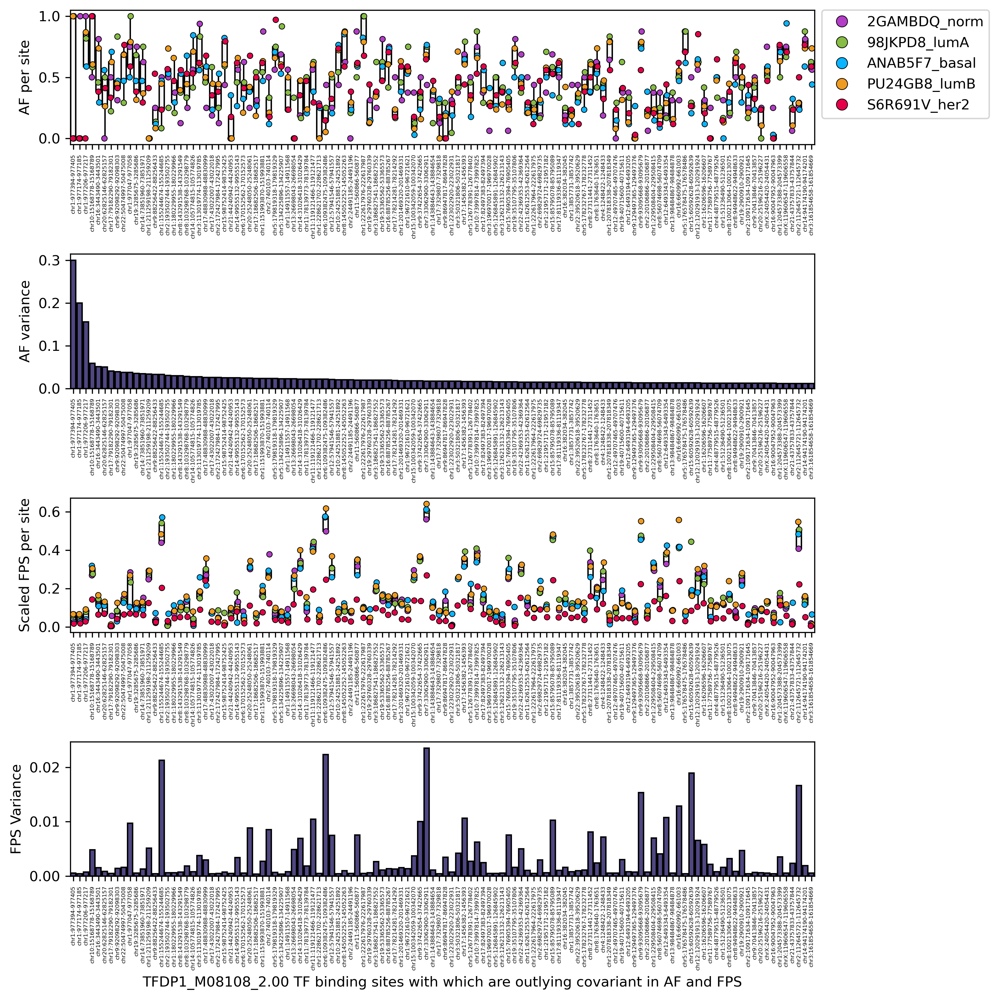

In [91]:
# create color dictionary
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=outliers_affps_full_srt, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=outliers_affps_full_srt, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF per site', fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=outliers_affps_full_srt, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF variance', fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=outliers_affps_full_srt, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=outliers_affps_full_srt, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('Scaled FPS per site', fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=outliers_affps_full_srt, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with which are outlying covariant in AF and FPS', fontsize=10)
plt.ylabel('FPS Variance', fontsize=10)
plt.subplots_adjust(hspace=0.8)
plt.tight_layout()
plt.show()

We can plot `lmplot` hued by `sample_id` to see if there are any patterns in the raw data.

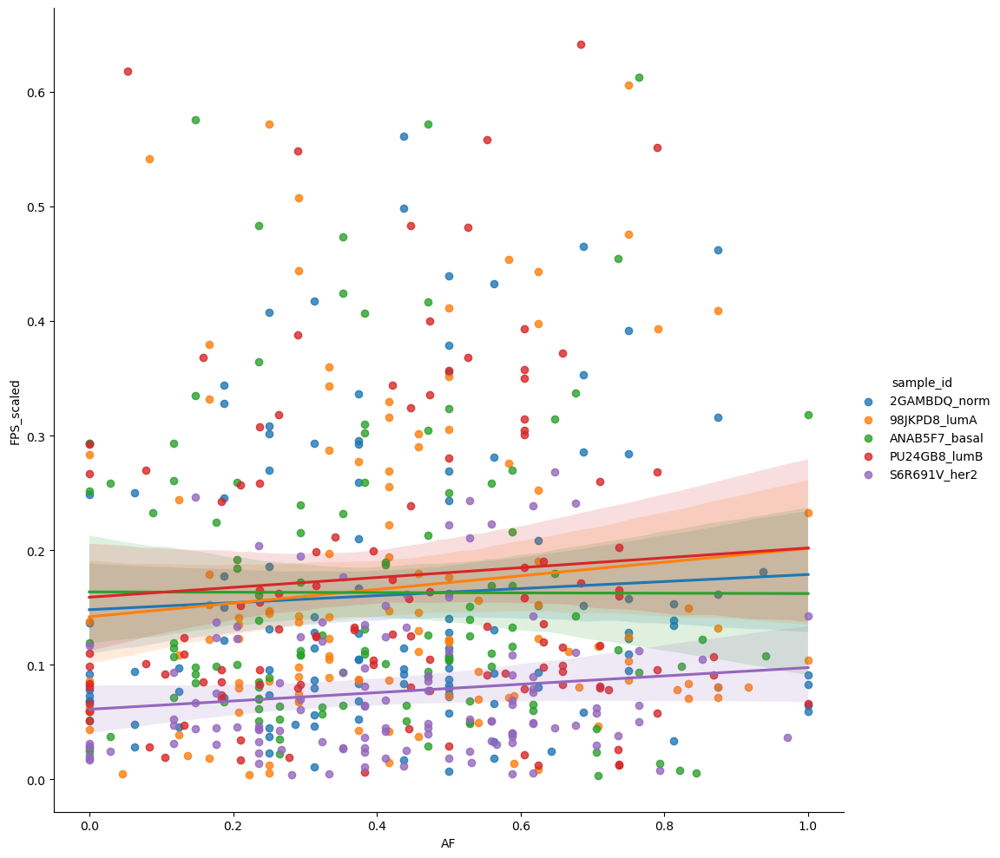

In [96]:
# plot jointplot of site_counts_sorted_top5
sns.lmplot(x='AF', y='FPS_scaled', data=outliers_affps_full, hue='sample_id', fit_reg=True, height=10)

In [97]:
outliers_affps_full_srt.head(30)

,sample_id,AF,FPS_scaled,AF_var,FPS_scaled_var
region_id,,,,,
chr1:977394-977405,2GAMBDQ_norm,1.0000000000,0.0643658129,0.3000000000,0.0005563766
chr1:977394-977405,98JKPD8_lumA,0.0000000000,0.0593050918,0.3000000000,0.0005563766
chr1:977394-977405,ANAB5F7_basal,0.0000000000,0.0245625089,0.3000000000,0.0005563766
chr1:977394-977405,PU24GB8_lumB,1.0000000000,0.0662564700,0.3000000000,0.0005563766
chr1:977394-977405,S6R691V_her2,0.0000000000,0.0169875217,0.3000000000,0.0005563766
chr1:977174-977185,2GAMBDQ_norm,1.0000000000,0.0592596922,0.2000000000,0.0004778301
chr1:977174-977185,98JKPD8_lumA,0.0000000000,0.0596479568,0.2000000000,0.0004778301
chr1:977174-977185,ANAB5F7_basal,0.0000000000,0.0270091055,0.2000000000,0.0004778301
chr1:977174-977185,PU24GB8_lumB,0.0000000000,0.0661802725,0.2000000000,0.0004778301


In [95]:
# test for correlation between AF and FPS_scaled for each subtype
from scipy.stats import spearmanr

# Group by 'sample_id' and calculate the correlation for each group
correlations = outliers_affps_full_srt.groupby('sample_id').apply(lambda group: spearmanr(group['AF'], group['FPS_scaled']), include_groups=False)

correlations



sample_id
2GAMBDQ_norm     (0.08901193055059906, 0.33779639888519797)
98JKPD8_lumA      (0.1418756810780453, 0.12539379321461294)
ANAB5F7_basal    (-0.02220883002389495, 0.8113297391941293)
PU24GB8_lumB      (0.0785881595367371, 0.39760429604137004)
S6R691V_her2       (0.1443583517024667, 0.1188494588641764)
dtype: object

How about we group by region_id?

In [111]:
outliers_affps_full_srt_raw = outliers_affps_full_srt.drop(columns=['AF_var', 'FPS_scaled_var'])

In [112]:
# reset index to make region_id a column
outliers_affps_full_srt_raw = outliers_affps_full_srt_raw.reset_index()
outliers_affps_full_srt_raw

,region_id,sample_id,AF,FPS_scaled
0,chr1:977394-977405,2GAMBDQ_norm,1.0000000000,0.0643658129
1,chr1:977394-977405,98JKPD8_lumA,0.0000000000,0.0593050918
2,chr1:977394-977405,ANAB5F7_basal,0.0000000000,0.0245625089
3,chr1:977394-977405,PU24GB8_lumB,1.0000000000,0.0662564700
4,chr1:977394-977405,S6R691V_her2,0.0000000000,0.0169875217
...,...,...,...,...
585,chr3:161854658-161854669,2GAMBDQ_norm,0.5625000000,0.0186790503
586,chr3:161854658-161854669,98JKPD8_lumA,0.6250000000,0.0083289816
587,chr3:161854658-161854669,ANAB5F7_basal,0.4411760000,0.0646379139
588,chr3:161854658-161854669,PU24GB8_lumB,0.7368420000,0.0121262920


In [118]:
# get the rows where the region_id == chr10:24251881-24251892
outliers_affps_full_srt_raw[outliers_affps_full_srt_raw['region_id'] == 'chr10:73997814-73997825']

,region_id,sample_id,AF,FPS_scaled
320,chr10:73997814-73997825,2GAMBDQ_norm,0.7500000000,0.3915507251
321,chr10:73997814-73997825,98JKPD8_lumA,0.8750000000,0.4088242896
322,chr10:73997814-73997825,ANAB5F7_basal,0.6764710000,0.3369189651
323,chr10:73997814-73997825,PU24GB8_lumB,0.6578950000,0.3716915306
324,chr10:73997814-73997825,S6R691V_her2,0.5294120000,0.2105827934


#### Spearman Correlation Test between AF and FPS_scaled

In [116]:
# Group by 'region_id' and calculate the correlation between AF and FPS_scaled for each group
correlations = outliers_affps_full_srt_raw.groupby('region_id').apply(lambda group: spearmanr(group['AF'], group['FPS_scaled']), include_groups=False)

correlations

region_id
chr10:15168778-15168789        (0.20519567041703085, 0.7405819415910722)
chr10:24251881-24251892        (0.09999999999999999, 0.8728885715695383)
chr10:73997814-73997825        (0.8999999999999998, 0.03738607346849875)
chr11:119121466-119121477                     (0.7, 0.18812040437418728)
chr11:560866-560877          (-0.49999999999999994, 0.39100221895577053)
                                                ...                     
chr9:88256422-88256433                        (-0.3, 0.6238376647810728)
chr9:92098292-92098303         (0.09999999999999999, 0.8728885715695383)
chr9:93095668-93095679                        (0.7, 0.18812040437418728)
chrX:119606547-119606558      (-0.09999999999999999, 0.8728885715695383)
chrX:24054420-24054431                        (0.6, 0.28475697986529375)
Length: 118, dtype: object

In [127]:
# that returned a pandas Series, so convert to dataframe
correlations_df = pd.DataFrame(correlations, columns=['corr_coeff_and_pvalue'])
# split the 'corr_coeff_and_pvalue' column into two separate columns using apply() and pd.Series
correlations_df[['corr_coeff', 'pvalue']] = correlations_df['corr_coeff_and_pvalue'].apply(pd.Series)
# drop the original column
correlations_df = correlations_df.drop(columns=['corr_coeff_and_pvalue']).reset_index()
correlations_df

,region_id,corr_coeff,pvalue
0,chr10:15168778-15168789,0.2051956704,0.7405819416
1,chr10:24251881-24251892,0.1000000000,0.8728885716
2,chr10:73997814-73997825,0.9000000000,0.0373860735
3,chr11:119121466-119121477,0.7000000000,0.1881204044
4,chr11:560866-560877,-0.5000000000,0.3910022190
...,...,...,...
113,chr9:88256422-88256433,-0.3000000000,0.6238376648
114,chr9:92098292-92098303,0.1000000000,0.8728885716
115,chr9:93095668-93095679,0.7000000000,0.1881204044
116,chrX:119606547-119606558,-0.1000000000,0.8728885716


In [131]:
# now sort region_id naturally
correlations_df_srt = correlations_df.reindex(index=index_natsorted(correlations_df['region_id']))
corr_df = correlations_df_srt.reset_index(drop=True)
corr_df

,region_id,corr_coeff,pvalue
0,chr1:977047-977058,0.5000000000,0.3910022190
1,chr1:977174-977185,0.0000000000,1.0000000000
2,chr1:977206-977217,0.9000000000,0.0373860735
3,chr1:977394-977405,0.8660254038,0.0576688856
4,chr1:3857731-3857742,-0.3000000000,0.6238376648
...,...,...,...
113,chr22:39520618-39520629,0.7000000000,0.1881204044
114,chr22:42369353-42369364,0.5000000000,0.3910022190
115,chr22:50474997-50475008,-0.2000000000,0.7470600781
116,chrX:24054420-24054431,0.6000000000,0.2847569799


In [157]:
# filter for pvalue < 0.05
corr_df_sig = corr_df[corr_df['pvalue'] < 0.05]
corr_df_sig

,region_id,corr_coeff,pvalue
2,chr1:977206-977217,0.9000000000,0.0373860735
65,chr10:73997814-73997825,0.9000000000,0.0373860735
75,chr12:120291913-120291924,-0.9000000000,0.0373860735
77,chr13:98484867-98484878,1.0000000000,0.0000000000
88,chr16:382034-382045,0.9000000000,0.0373860735
95,chr17:18682506-18682517,-0.9000000000,0.0373860735


#### Multiple Testing Correction
Now we need to correct for multiple testing. We can use the Benjamini-Hochberg method to correct for multiple testing.

In [156]:
from statsmodels.stats.multitest import multipletests

# apply Benjamini/Hochberg FDR correction
pvals = corr_df['pvalue']
fdr_corr = multipletests(pvals, alpha=0.05, method='fdr_bh')
fdr_corr

(array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False,  True, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False]),
 array([8.87274266e-01, 1.00000000e+00, 7.35259445e-01, 8.87

In [159]:
# add the corrected pvalues to the dataframe
corr_df_corrected = corr_df.copy()
corr_df_corrected['fdr_adj_pvalue'] = fdr_corr[1]

# filter for corrected pvalue < 0.05
corr_df_corrected_sig = corr_df_corrected[corr_df_corrected['fdr_adj_pvalue'] < 0.05]
corr_df_corrected_sig

,region_id,corr_coeff,pvalue,fdr_adj_pvalue
77,chr13:98484867-98484878,1.0000000000,0.0000000000,0.0000000000


#### ASIDE: Visualization of Correlation Coefficients at Filtered Covariant Sites

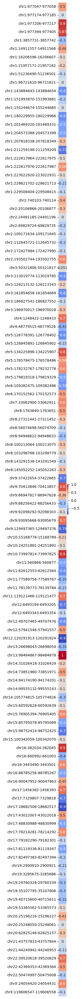

In [147]:
corr_df_i = corr_df.set_index('region_id')

# Convert the DataFrame to a 2D format suitable for a heatmap
df_2d = corr_df_i['corr_coeff'].to_numpy().reshape(-1, 1)

# Create a heatmap
plt.figure(figsize=(0.5,50))  # Adjust the figure size as needed
sns.heatmap(df_2d, annot=True, cmap='coolwarm', xticklabels=False, yticklabels=corr_df_i.index)
plt.show()

In [65]:
# strat 2
uniq_reg = high_af_fpsgtmean_all[['region_id', 'AF_var', 'FPS_scaled_var']].drop_duplicates()
# sort the region_id in the filtered high_af dataframe based on descending order of FPS_scaled_var
fpsvar_uniqsort = uniq_reg.sort_values(by='FPS_scaled_var', ascending=False)
# extract the region_id from the high_af_fps_var_df_uniqsort dataframe
sorted_region_ids = fpsvar_uniqsort['region_id']
# Change 'region_id' to a categorical variable with the categories ordered by 'sorted_region_ids'
df_copy = high_af_fpsgtmean_all.copy()
df_copy['region_id'] = pd.Categorical(high_af_fpsgtmean_all['region_id'], categories=sorted_region_ids, ordered=True)
# Filter the DataFrame
high_af_fpsgtmean_filt = df_copy[df_copy['region_id'].isin(sorted_region_ids)]
# Sort the DataFrame by 'region_id'
high_af_fpsgtmean_filtered = high_af_fpsgtmean_filt.sort_values('region_id')


uniq_reg = low_af_fpsgtmean_all[['region_id', 'AF_var', 'FPS_scaled_var']].drop_duplicates()
# sort the region_id in the filtered high_af dataframe based on descending order of FPS_scaled_var
fpsvar_uniqsort = uniq_reg.sort_values(by='FPS_scaled_var', ascending=False)
# extract the region_id from the high_af_fps_var_df_uniqsort dataframe
sorted_region_ids = fpsvar_uniqsort['region_id']
# Change 'region_id' to a categorical variable with the categories ordered by 'sorted_region_ids'
df_copy = low_af_fpsgtmean_all.copy()
df_copy['region_id'] = pd.Categorical(low_af_fpsgtmean_all['region_id'], categories=sorted_region_ids, ordered=True)
# Filter the DataFrame
low_af_fpsgtmean_filt = df_copy[df_copy['region_id'].isin(sorted_region_ids)]
# Sort the DataFrame by 'region_id'
low_af_fpsgtmean_filtered = low_af_fpsgtmean_filt.sort_values('region_id')


uniq_reg = high_af_fpsltmean_all[['region_id', 'AF_var', 'FPS_scaled_var']].drop_duplicates()
# sort the region_id in the filtered high_af dataframe based on descending order of FPS_scaled_var
fpsvar_uniqsort = uniq_reg.sort_values(by='FPS_scaled_var', ascending=False)
# extract the region_id from the high_af_fps_var_df_uniqsort dataframe
sorted_region_ids = fpsvar_uniqsort['region_id']
# Change 'region_id' to a categorical variable with the categories ordered by 'sorted_region_ids'
df_copy = high_af_fpsltmean_all.copy()
df_copy['region_id'] = pd.Categorical(high_af_fpsltmean_all['region_id'], categories=sorted_region_ids, ordered=True)
# Filter the DataFrame
high_af_fpsltmean_filt = df_copy[df_copy['region_id'].isin(sorted_region_ids)]
# Sort the DataFrame by 'region_id'
high_af_fpsltmean_filtered = high_af_fpsltmean_filt.sort_values('region_id')


uniq_reg = low_af_fpsltmean_all[['region_id', 'AF_var', 'FPS_scaled_var']].drop_duplicates()
# sort the region_id in the filtered high_af dataframe based on descending order of FPS_scaled_var
fpsvar_uniqsort = uniq_reg.sort_values(by='FPS_scaled_var', ascending=False)
# extract the region_id from the high_af_fps_var_df_uniqsort dataframe
sorted_region_ids = fpsvar_uniqsort['region_id']
# Change 'region_id' to a categorical variable with the categories ordered by 'sorted_region_ids'
df_copy = low_af_fpsltmean_all.copy()
df_copy['region_id'] = pd.Categorical(low_af_fpsltmean_all['region_id'], categories=sorted_region_ids, ordered=True)
# Filter the DataFrame
low_af_fpsltmean_filt = df_copy[df_copy['region_id'].isin(sorted_region_ids)]
# Sort the DataFrame by 'region_id'
low_af_fpsltmean_filtered = low_af_fpsltmean_filt.sort_values('region_id')


Next, sort the sample_id values per each unique region_id by a specific order. This order is based on the lexicographic order of the sample_id values in the original matrix.

In [66]:
# get unique sample_id values into a list to define a categorical order
datasets = high_nzaf_filtered['sample_id'].unique().tolist()
datasets = sorted(datasets)

# Create a categorical variable with ordered categories
dataset_copy = high_nzaf_filtered.copy()
dataset_copy['sample_id'] = pd.Categorical(dataset_copy['sample_id'], categories=datasets, ordered=True)

# Sort 'sample_id' within each 'region_id'
high_nzaf_filtsorted = dataset_copy.groupby('region_id', sort=False, observed=False).apply(lambda x: x.sort_values('sample_id')).reset_index(drop=True)

# do the same for high_af_fpsgtmean_all, low_af_fpsgtmean_all, high_af_fpsltmean_all, low_af_fpsltmean_all

dataset_copy = high_af_fpsgtmean_filtered.copy()
dataset_copy['sample_id'] = pd.Categorical(dataset_copy['sample_id'], categories=datasets, ordered=True)
high_af_fpsgtmean_filtsorted = dataset_copy.groupby('region_id', sort=False, observed=False).apply(lambda x: x.sort_values('sample_id')).reset_index(drop=True)

dataset_copy = low_af_fpsgtmean_filtered.copy()
dataset_copy['sample_id'] = pd.Categorical(dataset_copy['sample_id'], categories=datasets, ordered=True)
low_af_fpsgtmean_filtsorted = dataset_copy.groupby('region_id', sort=False, observed=False).apply(lambda x: x.sort_values('sample_id')).reset_index(drop=True)

dataset_copy = high_af_fpsltmean_filtered.copy()
dataset_copy['sample_id'] = pd.Categorical(dataset_copy['sample_id'], categories=datasets, ordered=True)
high_af_fpsltmean_filtsorted = dataset_copy.groupby('region_id', sort=False, observed=False).apply(lambda x: x.sort_values('sample_id')).reset_index(drop=True)

dataset_copy = low_af_fpsltmean_filtered.copy()
dataset_copy['sample_id'] = pd.Categorical(dataset_copy['sample_id'], categories=datasets, ordered=True)
low_af_fpsltmean_filtsorted = dataset_copy.groupby('region_id', sort=False, observed=False).apply(lambda x: x.sort_values('sample_id')).reset_index(drop=True)


/var/folders/cj/48kxs2k94p7fmnmdbb42jxv00000gn/T/ipykernel_21389/3123881717.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  high_nzaf_filtsorted = dataset_copy.groupby('region_id', sort=False, observed=False).apply(lambda x: x.sort_values('sample_id')).reset_index(drop=True)
/var/folders/cj/48kxs2k94p7fmnmdbb42jxv00000gn/T/ipykernel_21389/3123881717.py:16: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  

In [67]:
high_nzaf_filtsorted.head()

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
0,chr2:84216355-84216366,2GAMBDQ_norm,0.928571,3.60913,0.958827,0.480584,0.066372,0.004836
1,chr2:84216355-84216366,98JKPD8_lumA,0.818182,2.24927,0.593228,0.480584,0.066372,0.004836
2,chr2:84216355-84216366,ANAB5F7_basal,1.000000,1.79019,0.454815,0.480584,0.066372,0.004836
3,chr2:84216355-84216366,PU24GB8_lumB,0.900000,2.86361,0.779286,0.480584,0.066372,0.004836
4,chr2:84216355-84216366,S6R691V_her2,0.857143,2.35684,0.308047,0.480584,0.066372,0.004836


In [68]:
high_af_fpsgtmean_filtsorted.head()

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
0,chr2:84216355-84216366,2GAMBDQ_norm,0.928571,3.60913,0.958827,0.480584,0.066372,0.004836
1,chr2:84216355-84216366,98JKPD8_lumA,0.818182,2.24927,0.593228,0.480584,0.066372,0.004836
2,chr2:84216355-84216366,ANAB5F7_basal,1.000000,1.79019,0.454815,0.480584,0.066372,0.004836
3,chr2:84216355-84216366,PU24GB8_lumB,0.900000,2.86361,0.779286,0.480584,0.066372,0.004836
4,chr2:84216355-84216366,S6R691V_her2,0.857143,2.35684,0.308047,0.480584,0.066372,0.004836


In [69]:
low_af_fpsgtmean_filtsorted.head()

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
0,chr8:126558440-126558451,2GAMBDQ_norm,0.125000,1.95375,0.519047,0.236964,0.038931,0.001337
1,chr8:126558440-126558451,98JKPD8_lumA,0.166667,2.03162,0.535824,0.236964,0.038931,0.001337
2,chr8:126558440-126558451,ANAB5F7_basal,0.088235,1.87539,0.476461,0.236964,0.038931,0.001337
3,chr8:126558440-126558451,PU24GB8_lumB,0.078947,3.06962,0.835348,0.236964,0.038931,0.001337
4,chr8:126558440-126558451,S6R691V_her2,0.088235,2.18924,0.286141,0.236964,0.038931,0.001337


In [70]:
high_af_fpsltmean_filtsorted.head()

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
0,chr19:35306373-35306384,2GAMBDQ_norm,0.812500,0.07781,0.020672,0.002463,0.000214,0.008205
1,chr19:35306373-35306384,98JKPD8_lumA,0.590909,0.09118,0.024048,0.002463,0.000214,0.008205
2,chr19:35306373-35306384,ANAB5F7_basal,0.600000,0.01374,0.003491,0.002463,0.000214,0.008205
3,chr19:35306373-35306384,PU24GB8_lumB,0.657895,0.14387,0.039152,0.002463,0.000214,0.008205
4,chr19:35306373-35306384,S6R691V_her2,0.625000,0.04190,0.005476,0.002463,0.000214,0.008205


In [71]:
low_af_fpsltmean_filtsorted.head()

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
0,chr16:54066087-54066098,2GAMBDQ_norm,0.187500,0.06869,0.018249,0.001838,0.000162,0.005087
1,chr16:54066087-54066098,98JKPD8_lumA,0.208333,0.14332,0.037800,0.001838,0.000162,0.005087
2,chr16:54066087-54066098,ANAB5F7_basal,0.352941,0.02967,0.007538,0.001838,0.000162,0.005087
3,chr16:54066087-54066098,PU24GB8_lumB,0.264706,0.08437,0.022960,0.001838,0.000162,0.005087
4,chr16:54066087-54066098,S6R691V_her2,0.323529,0.05253,0.006866,0.001838,0.000162,0.005087


/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/si

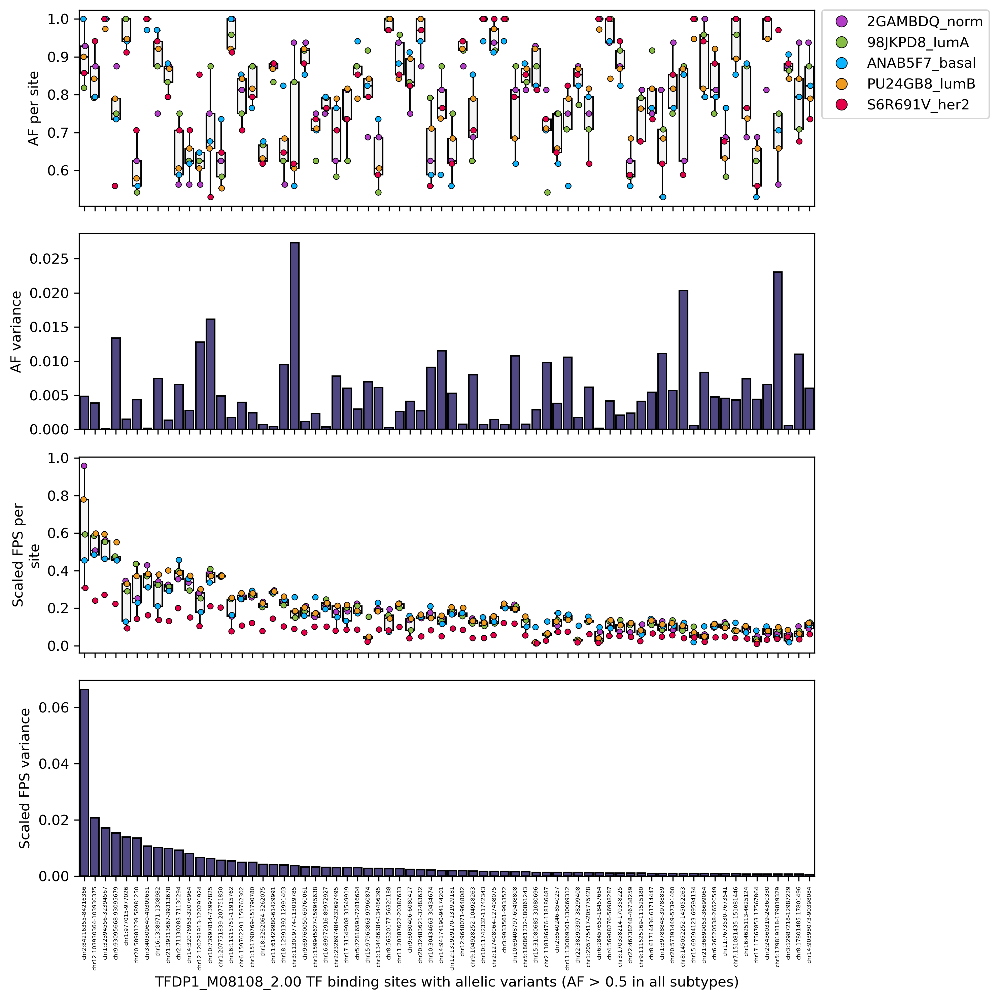

In [72]:
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=high_nzaf_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF per site', width=15)
plt.ylabel(ylabel, fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_filtsorted, color='darkslateblue', edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF variance', width=15)
plt.ylabel(ylabel, fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=high_nzaf_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS per site', width=15)
plt.ylabel(ylabel, fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_filtsorted, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (AF > 0.5 in all subtypes)', fontsize=10)
plt.ylabel('Scaled FPS variance', fontsize=10)
plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.show()

/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/si

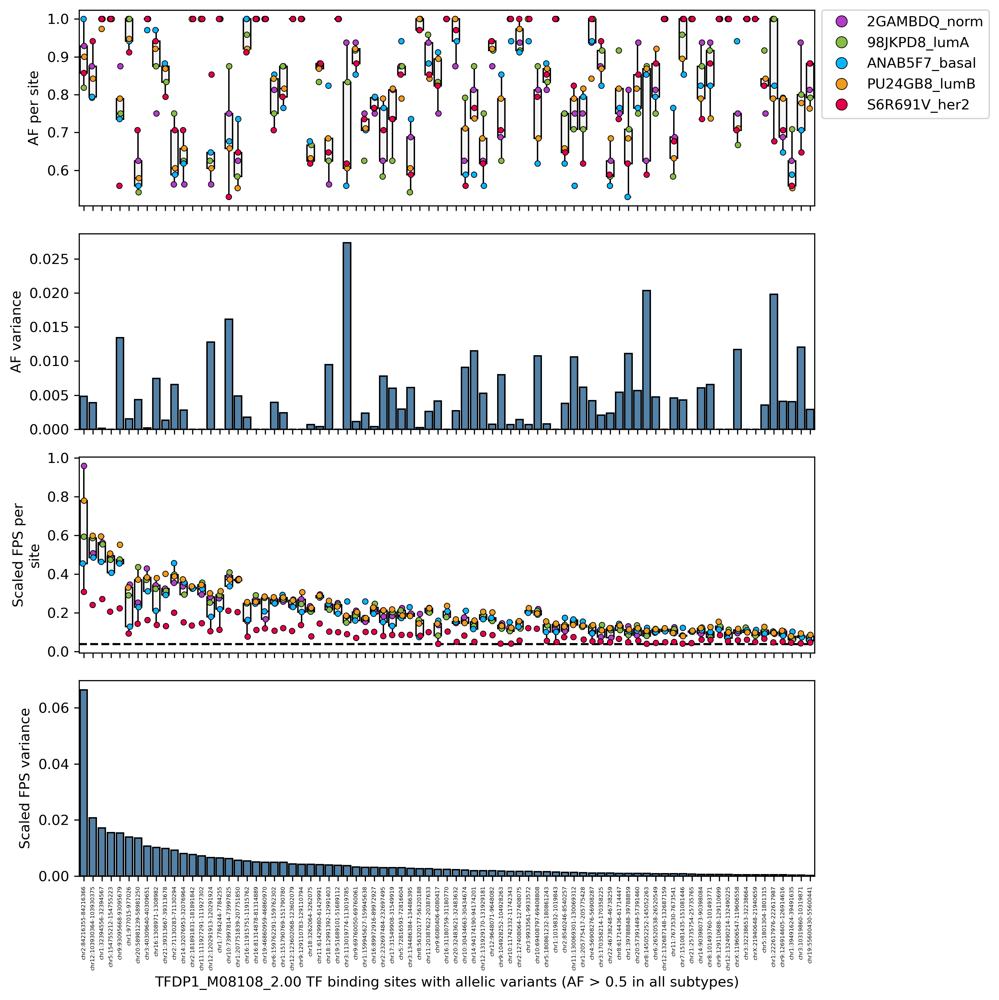

In [73]:
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_af_fpsgtmean_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=high_af_fpsgtmean_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF per site', width=15)
plt.ylabel(ylabel, fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_af_fpsgtmean_filtsorted, color='steelblue', edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF variance', width=15)
plt.ylabel(ylabel, fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_af_fpsgtmean_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=high_af_fpsgtmean_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
# plot horizontal line at fps_scaled_global_mean
plt.axhline(y=fps_scaled_global_mean, color='black', linestyle='--')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS per site', width=15)
plt.ylabel(ylabel, fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_af_fpsgtmean_filtsorted, color='steelblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (AF > 0.5 in all subtypes)', fontsize=10)
plt.ylabel('Scaled FPS variance', fontsize=10)
plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.show()

/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/si

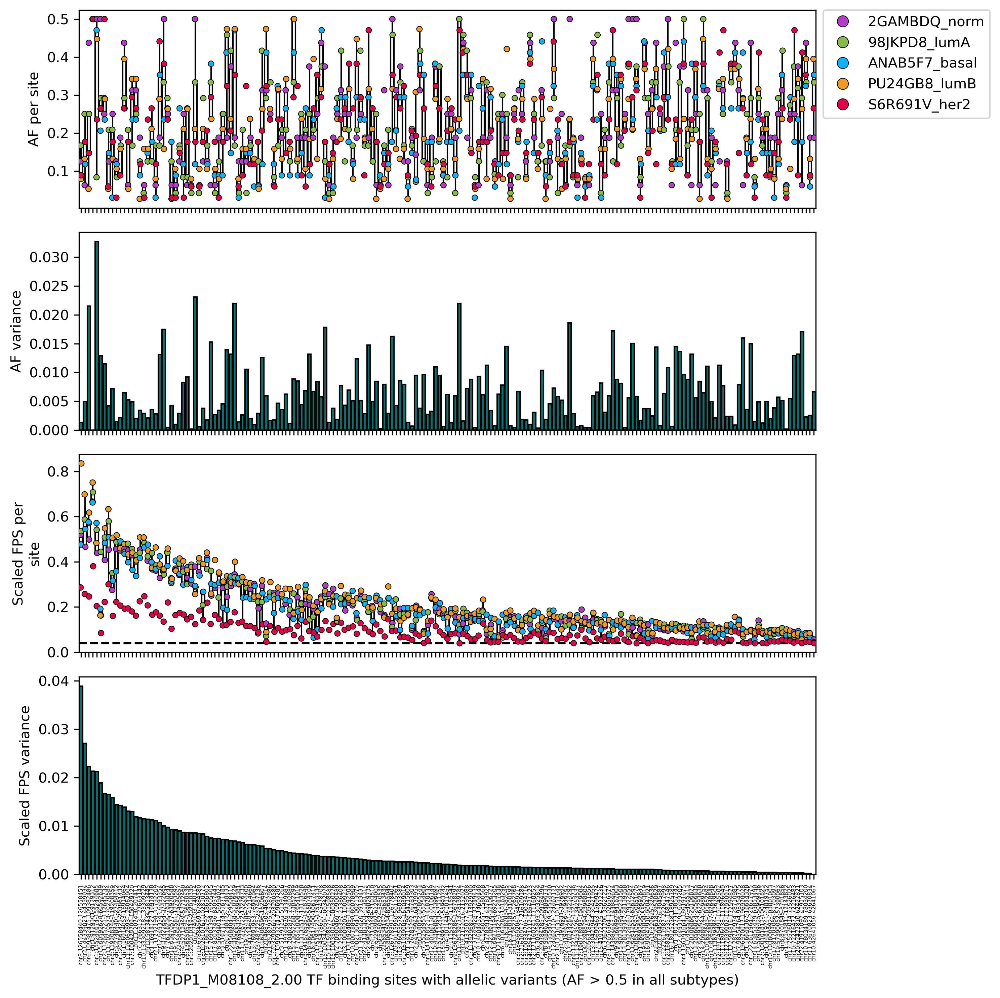

In [74]:
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=low_af_fpsgtmean_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=low_af_fpsgtmean_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF per site', width=15)
plt.ylabel(ylabel, fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=low_af_fpsgtmean_filtsorted, color='teal', edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF variance', width=15)
plt.ylabel(ylabel, fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=low_af_fpsgtmean_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=low_af_fpsgtmean_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
# plot horizontal line at fps_scaled_global_mean
plt.axhline(y=fps_scaled_global_mean, color='black', linestyle='--')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS per site', width=15)
plt.ylabel(ylabel, fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=low_af_fpsgtmean_filtsorted, color='teal', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (AF > 0.5 in all subtypes)', fontsize=10)
plt.ylabel('Scaled FPS variance', fontsize=10)
plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.show()

/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/si

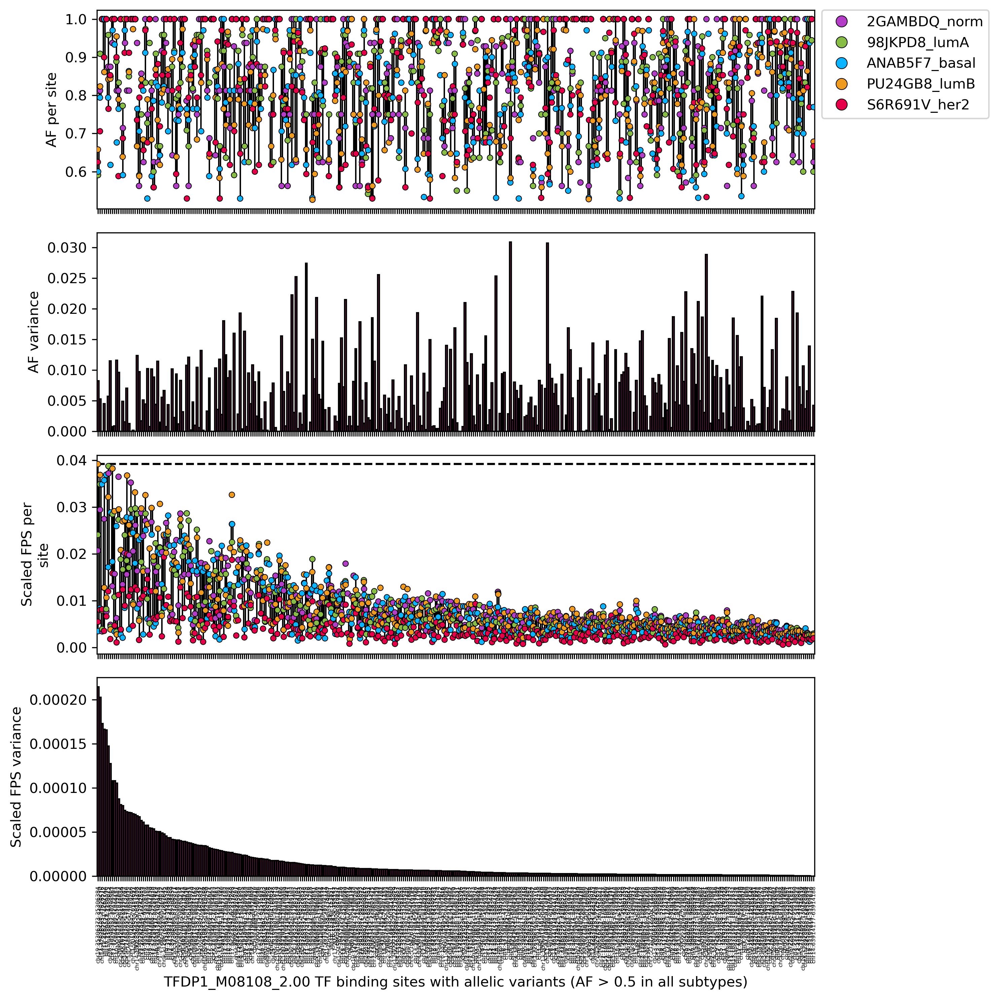

In [75]:
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
import textwrap
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_af_fpsltmean_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=high_af_fpsltmean_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF per site', width=15)
plt.ylabel(ylabel, fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_af_fpsltmean_filtsorted, color='mediumvioletred', edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF variance', width=15)
plt.ylabel(ylabel, fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_af_fpsltmean_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=high_af_fpsltmean_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
# plot horizontal line at fps_scaled_global_median
plt.axhline(y=fps_scaled_global_mean, color='black', linestyle='--')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS per site', width=15)
plt.ylabel(ylabel, fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_af_fpsltmean_filtsorted, color='mediumvioletred', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (AF > 0.5 in all subtypes)', fontsize=10)
plt.ylabel('Scaled FPS variance', fontsize=10)
plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.show()

/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/si

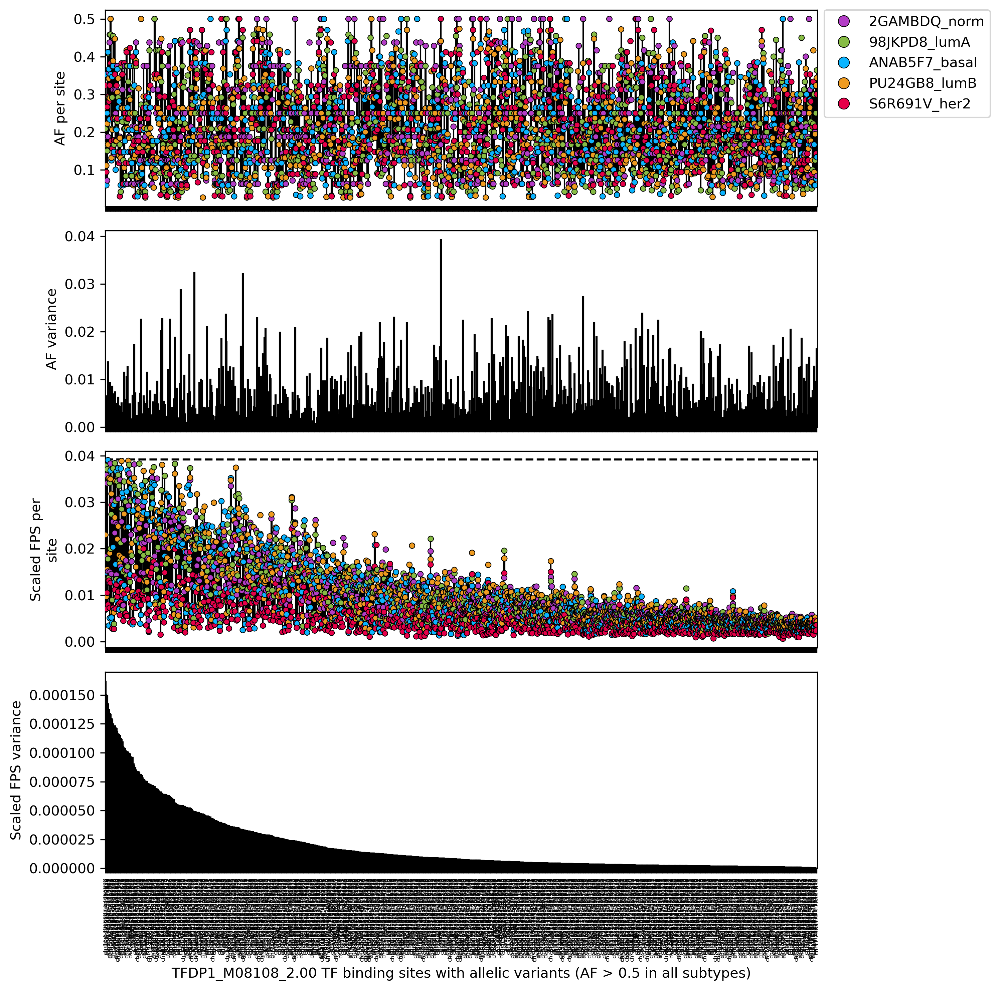

In [76]:
dutchfield_colordict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=low_af_fpsltmean_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=low_af_fpsltmean_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF per site', width=15)
plt.ylabel(ylabel, fontsize=10)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)

plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=low_af_fpsltmean_filtsorted, color='darkolivegreen', edgecolor='black')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('AF variance', width=15)
plt.ylabel(ylabel, fontsize=10)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=low_af_fpsltmean_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=low_af_fpsltmean_filtsorted, hue='sample_id', palette=dutchfield_colordict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
# plot horizontal line at fps_scaled_global_mean
plt.axhline(y=fps_scaled_global_mean, color='black', linestyle='--')
plt.xticks(ticks=plt.xticks()[0], labels=[])
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS per site', width=15)
plt.ylabel(ylabel, fontsize=10)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=low_af_fpsltmean_filtsorted, color='darkolivegreen', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (AF > 0.5 in all subtypes)', fontsize=10)
plt.ylabel('Scaled FPS variance', fontsize=10)
plt.subplots_adjust(hspace=0.05)
plt.tight_layout()
plt.show()

#### Strategy 1: Subtype highlighting

For FPS distribution there are subtypes that are more represented that others. Let's try to selectively highlight subtypes which are the maxima per site. 

In [77]:
# Find the index of the max FPS_scaled value for each region_id
idx_max = high_nzaf_filtsorted.groupby('region_id', observed=True)['FPS_scaled'].idxmax()
idx_min = high_nzaf_filtsorted.groupby('region_id', observed=True)['FPS_scaled'].idxmin()
# Select the corresponding rows
max_fps_scaled = high_nzaf_filtsorted.loc[idx_max]
min_fps_scaled = high_nzaf_filtsorted.loc[idx_min]

# do the same for AF
idx_max_af = high_nzaf_filtsorted.groupby('region_id', observed=True)['AF'].idxmax()
idx_min_af = high_nzaf_filtsorted.groupby('region_id', observed=True)['AF'].idxmin()
# Select the corresponding rows
max_af_raw = high_nzaf_filtsorted.loc[idx_max_af]
min_af_raw = high_nzaf_filtsorted.loc[idx_min_af]

In [78]:
# create masks for the inverse of max and min values
mask = ~high_nzaf_filtsorted.index.isin(idx_max)
max_fps_scaled_inv = high_nzaf_filtsorted[mask]

mask = ~high_nzaf_filtsorted.index.isin(idx_min)
min_fps_scaled_inv = high_nzaf_filtsorted[mask]

# do the same for AF
mask = ~high_nzaf_filtsorted.index.isin(idx_max_af)
max_af_raw_inv = high_nzaf_filtsorted[mask]

mask = ~high_nzaf_filtsorted.index.isin(idx_min_af)
min_af_raw_inv = high_nzaf_filtsorted[mask]

In [79]:
# create color dictionary
color_dict = {'S6R691V_her2': "#e60049", 'ANAB5F7_basal': "#0bb4ff", '98JKPD8_lumA': "#87bc45", 'PU24GB8_lumB': "#ef9b20", '2GAMBDQ_norm': "#b33dc6"}
gray = 'lightgray'
color_gray_dict = {'S6R691V_her2': gray, 'ANAB5F7_basal': gray, '98JKPD8_lumA': gray, 'PU24GB8_lumB': gray, '2GAMBDQ_norm': gray}

/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users/sufyazi/Applications/bin/miniforge3/envs/quarto-docs/lib/python3.12/site-packages/seaborn/_base.py:949: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/Users

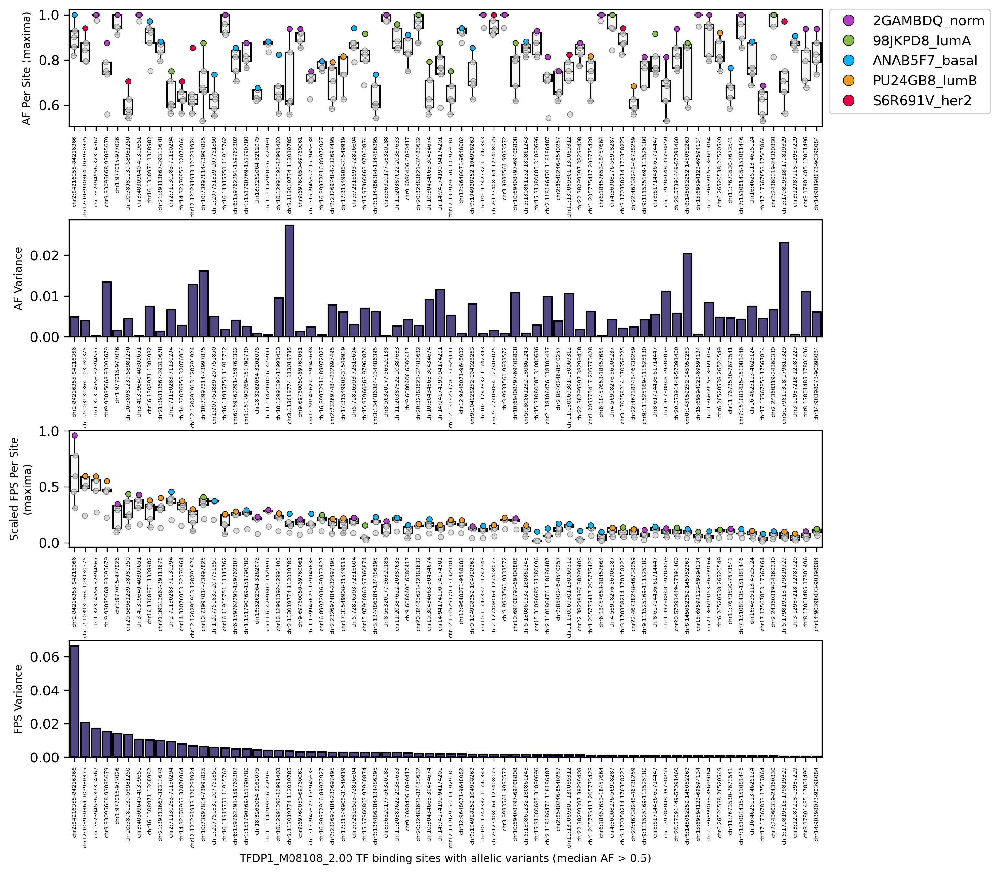

In [80]:
plt.figure(figsize=(10, 10), dpi=300)
# specify subplot
plt.subplot(4, 1, 1)
sns.boxplot(x='region_id', y='AF', data=high_nzaf_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='AF', data=max_af_raw_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='AF', data=max_af_raw, hue='sample_id', palette=color_dict, size=4, jitter=True, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
ylabel = textwrap.fill('AF Per Site (maxima)', width=20)
plt.ylabel(ylabel, fontsize=8)
# place legend outside of the plot
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0, markerscale=2, fontsize=10)
plt.subplot(4, 1, 2)
sns.barplot(x='region_id', y='AF_var', data=high_nzaf_filtsorted, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
plt.ylabel('AF Variance', fontsize=8)
  
plt.subplot(4, 1, 3)
sns.boxplot(x='region_id', y='FPS_scaled', data=high_nzaf_filtsorted, color='whitesmoke', linecolor='black', showfliers=False)
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled_inv, hue='sample_id', palette=color_gray_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='dimgray', alpha=0.8)
sns.stripplot(x='region_id', y='FPS_scaled', data=max_fps_scaled, hue='sample_id', palette=color_dict, size=4, jitter=True, legend=False, linewidth=0.5, edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel('')
ylabel = textwrap.fill('Scaled FPS Per Site (maxima)', width=20)
plt.ylabel(ylabel, fontsize=8)

plt.subplot(4, 1, 4)
sns.barplot(x='region_id', y='FPS_scaled_var', data=high_nzaf_filtsorted, color='darkslateblue', edgecolor='black')
plt.xticks(rotation=90, fontsize=4)
plt.xlabel(f'{motif_id} TF binding sites with allelic variants (median AF > 0.5)', fontsize=8)
plt.ylabel('FPS Variance', fontsize=8)
plt.subplots_adjust(hspace=0.8)

plt.show()

In [81]:
high_nzaf_filtsorted

,region_id,sample_id,AF,FPS,FPS_scaled,FPS_var,FPS_scaled_var,AF_var
0,chr2:84216355-84216366,2GAMBDQ_norm,0.928571,3.60913,0.958827,0.480584,0.066372,0.004836
1,chr2:84216355-84216366,98JKPD8_lumA,0.818182,2.24927,0.593228,0.480584,0.066372,0.004836
2,chr2:84216355-84216366,ANAB5F7_basal,1.000000,1.79019,0.454815,0.480584,0.066372,0.004836
3,chr2:84216355-84216366,PU24GB8_lumB,0.900000,2.86361,0.779286,0.480584,0.066372,0.004836
4,chr2:84216355-84216366,S6R691V_her2,0.857143,2.35684,0.308047,0.480584,0.066372,0.004836
...,...,...,...,...,...,...,...,...
345,chr14:90398073-90398084,2GAMBDQ_norm,0.937500,0.34468,0.091570,0.002642,0.000669,0.006053
346,chr14:90398073-90398084,98JKPD8_lumA,0.875000,0.47013,0.123993,0.002642,0.000669,0.006053
347,chr14:90398073-90398084,ANAB5F7_basal,0.823529,0.43186,0.109718,0.002642,0.000669,0.006053
348,chr14:90398073-90398084,PU24GB8_lumB,0.789474,0.44464,0.121002,0.002642,0.000669,0.006053


In [82]:
# spearman correlation between AF and FPS_scaled for each subtype in the high_nzaf_filtsorted dataframe; it will tell you that when you rank the FPS values across all sites for one subtype, do you see a similar ranking for AF values across all sites for that subtype

import scipy.stats as stats

for subtype in high_nzaf_filtsorted['sample_id'].unique():
	corr_df = high_nzaf_filtsorted[high_nzaf_filtsorted['sample_id'] == subtype].copy()
	correlation, pvalue = stats.spearmanr(corr_df['FPS_scaled'], corr_df['AF'])
	print(subtype, correlation, pvalue)

2GAMBDQ_norm -0.07043233370514121 0.562326669195969
98JKPD8_lumA -0.06794254660134656 0.5762577789484744
ANAB5F7_basal -0.1204524791162335 0.3205860752059085
PU24GB8_lumB -0.07550600951827419 0.5344406071769667
S6R691V_her2 -0.09221847208208683 0.4476834320040459


In [83]:
# quantify the number of filtered sites per sample_id
max_af_raw_subset = max_af_raw[['region_id', 'sample_id']]
max_af_raw_df = max_af_raw_subset.groupby('sample_id', observed=False)['region_id'].count().to_frame()

In [84]:
max_af_raw_df

,region_id
sample_id,
2GAMBDQ_norm,26
98JKPD8_lumA,13
ANAB5F7_basal,18
PU24GB8_lumB,5
S6R691V_her2,8


In [85]:
max_fps_scaled_subset = max_fps_scaled[['region_id', 'sample_id']]
max_fps_scaled_df = max_fps_scaled_subset.groupby('sample_id', observed=False)['region_id'].count().to_frame()

In [86]:
max_fps_scaled_df

,region_id
sample_id,
2GAMBDQ_norm,14
98JKPD8_lumA,9
ANAB5F7_basal,23
PU24GB8_lumB,24
S6R691V_her2,0
